<br><br>
<span style="font-family: Courier New; font-size: 20px; font-weight: bold;">  
SC1015 Final Mini-Project // Formula 1
</span>
<br><br>

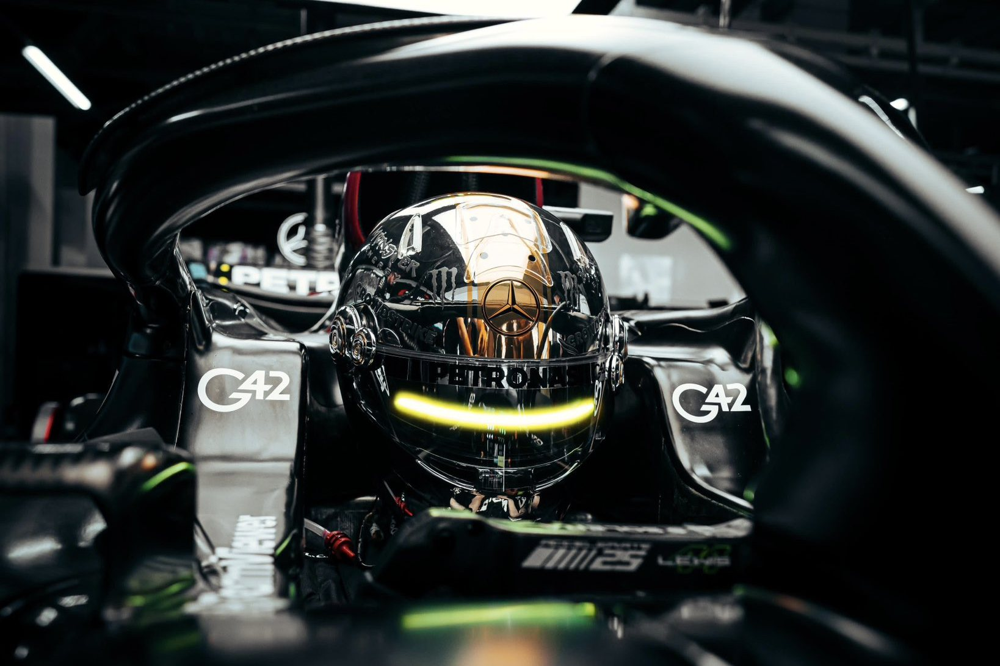

In [1]:
import pandas as pd
import numpy as np
import requests
import re
import datetime
import seaborn as sb
import matplotlib.pyplot as plt
pd.set_option('display.max_rows', 1000)

In [2]:
drivers = pd.read_csv('/Users/adisontan/Downloads/driversgit.csv')
laptimes = pd.read_csv('/Users/adisontan/Downloads/laptimesgit.csv')
qualifying = pd.read_csv('/Users/adisontan/Downloads/qualifyinggit.csv') 
races = pd.read_csv('/Users/adisontan/Downloads/racesgit.csv') 
sgppits = pd.read_csv('/Users/adisontan/Downloads/sgppitsgitfinal.csv') 
results = pd.read_csv('/Users/adisontan/Downloads/resultsgit.csv') 
weather = pd.read_csv('/Users/adisontan/Downloads/weatherdescriptiongit.csv') 

<br><br>
<span style="font-family: Courier New; font-size: 20px; font-weight: bold;">  
Data Preparation and Cleaning
</span>
<br><br><br>

In [3]:
# function defintion for adding 'position' column to dataframe

def add_position(df):
    df['position'] = ""
    index2 = -1
    for i in df.iterrows():
        index1 = 0
        index2 += 1
        for j in sgpresults.iterrows():
            if(sgpresults['raceId'].values[index1] == df['raceId'].values[index2] and sgpresults['driverId'].values[index1] == df['driverId'].values[index2]):
                df.loc[index2, 'position'] = sgpresults['position'].values[index1]
                break
            else:
                index1 += 1

In [4]:
# function definition for changing driverId to driver code/name

def add_drivers(df):
    driverslist = driversdf.set_index('driverId').T.to_dict('records') 
    for i in driverslist:
        driversdict = i
    df['driverId'] = df['driverId'].map(driversdict)

In [5]:
# function defintion for changing raceId to year of race

def add_years(df):
    j = 0
    years = [2009, 2008, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2022]
    for i in sgpIds:
        updated = df['raceId'] == i
        df.loc[updated, 'raceId'] = years[j]
        j += 1

In [6]:
# matches the driver codes to the driverId

driversdf = drivers[['code', 'driverId']]
driversdf = driversdf.dropna()
driversdf.head()

# extract spg grand prix raceId and year

sgpraces = races.loc[races['circuitId'] == 15, ['raceId']] #14 is 2009, #32 is 2008, #351 is 2010, #854 is 2011, #873 is 2012, #893 is 2013, #913 is 2014, #939 is 2015, #962 is 2016, #982 is 2017, #1003 is 2018, #1024 is 2019, #1091 is 2022
sgpIds = []
sgpIds.extend(sgpraces.raceId) # compile all singapore raceIds into a list
sgplaptimes = laptimes.loc[laptimes['raceId'].isin(sgpIds)] # laptimes for all drivers for all sgp GPs

# extract Singapore Grand Prix starting grid position

sgpgriddf = qualifying.loc[qualifying['raceId'].isin(sgpIds)]
sgpgrid = sgpgriddf[['raceId', 'position', 'driverId']]
sgpgrid.rename(columns={'position': 'grid'}, inplace=True)

# extract Singapore Grand Prix points and fastest lap timing

sgpresultsdf = results.loc[results['raceId'].isin(sgpIds)]
sgpresults = sgpresultsdf[['raceId', 'driverId', 'constructorId', 'points', 'fastestLapTime', 'position']]
sgpresults = sgpresults.sort_values(by='raceId')

# extract Singapore Grand Prix weather condition

sgpweatherdf = weather.loc[weather['race_id'].isin(sgpIds)]
sgpweather = sgpweatherdf[['is_it_wet', 'race_id']]
sgpweather.rename(columns={'is_it_wet': 'weather', 'race_id': 'raceId'}, inplace=True)

# change the position of the drivers to show top 5 , not top 5 and DNF

add_years(sgpresults)
sgpresults.loc[sgpresults['position'] == '\\N', 'position'] = -1 # set DNF to -1 for EDA
sgpresults['position'] = sgpresults['position'].astype(str).astype(int)
for i in sgpresults['position']:
    if (i >= 1 and i <= 5): 
        sgpresults.loc[sgpresults['position'] == i, 'position'] = 1 # set drivers who finish in top 5 to 1
    elif (i <= 0):
        continue
    elif (i > 5 and i <= 22):
        sgpresults.loc[sgpresults['position'] == i, 'position'] = 0 # set drivers who finish outside of top 5 to 0

"""
for i in sgpresults.iterrows():
    pos = sgpresults['position'].values[index2]
    if (pos == -1):
        raceyear = sgpresults['raceId'].values[index2]
        if (raceyear == 2010 or raceyear == 2011 or raceyear == 2012):
            pos = 24
        elif (raceyear == 2013 or raceyear == 2014 or raceyear == 2016):
            pos = 22 
        else:
            pos = 20 
        sgpresults['position'].values[index2] = pos
        index2 += 1
    # elif (i >= 1 and i <= 5): 
        # sgpresults.loc[sgpresults['position'] == i, 'position'] = 1 # set drivers who finish in top 5 to 1
    # elif (i <= 0):
        # continue
    # elif (i > 5 and i <= 22):
        # sgpresults.loc[sgpresults['position'] == i, 'position'] = 0 # set drivers who finish outside of top 5 to 0
    else:
        index2 += 1
        continue
"""

/var/folders/w8/d9x92py92j792gw_1kyfc8sh0000gn/T/ipykernel_49673/426601657.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sgpgrid.rename(columns={'position': 'grid'}, inplace=True)
/var/folders/w8/d9x92py92j792gw_1kyfc8sh0000gn/T/ipykernel_49673/426601657.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sgpweather.rename(columns={'is_it_wet': 'weather', 'race_id': 'raceId'}, inplace=True)


"\nfor i in sgpresults.iterrows():\n    pos = sgpresults['position'].values[index2]\n    if (pos == -1):\n        raceyear = sgpresults['raceId'].values[index2]\n        if (raceyear == 2010 or raceyear == 2011 or raceyear == 2012):\n            pos = 24\n        elif (raceyear == 2013 or raceyear == 2014 or raceyear == 2016):\n            pos = 22 \n        else:\n            pos = 20 \n        sgpresults['position'].values[index2] = pos\n        index2 += 1\n    # elif (i >= 1 and i <= 5): \n        # sgpresults.loc[sgpresults['position'] == i, 'position'] = 1 # set drivers who finish in top 5 to 1\n    # elif (i <= 0):\n        # continue\n    # elif (i > 5 and i <= 22):\n        # sgpresults.loc[sgpresults['position'] == i, 'position'] = 0 # set drivers who finish outside of top 5 to 0\n    else:\n        index2 += 1\n        continue\n"

In [7]:
# calculate the average pitstop time for each driver for every edition of the Singapore Grand Prix. pitdf is the df for the average pit times for all drivers for all sgp grand prixs over the years.

sgppits = sgppits.drop(columns='Unnamed: 0') # clean sgppits data
pitcolumns = ['averagepit(s)', 'raceId', 'driverId']
driverdf = drivers.drop_duplicates(subset=['driverId'], keep='last')
pitdf = pd.DataFrame(columns=pitcolumns)
driverlist = driverdf['driverId'].tolist()
stoplist = driverdf['driverId'].tolist()
stopdict = {}
driverdict = {}
sgppits['duration'] = sgppits['duration'].astype(float)
index = 0
curraceid = 0
preraceid = sgppits['raceId'].values[0]
avetime = 0
dfindex = 0
j = 0
for j in driverlist:
    driverdict[j] = 0
    stopdict[j] = 0
for i in sgppits.iterrows():
    curraceid = sgppits['raceId'].values[index]
    if (curraceid == preraceid):
        time = sgppits['duration'].values[index]
        driverId = sgppits['driverId'].values[index]
        stopno = sgppits['stop'].values[index]
        curtime = driverdict[driverId]
        driverdict[driverId] = curtime + time
        if (stopdict[driverId] < stopno):
            stopdict[driverId] = stopno
        index += 1
        preraceid = curraceid
        continue
    else:
        for k in driverdict:
            if (driverdict[k] != 0):
                avetime = round(driverdict[k]/stopdict[k], 3)
                pitdf.loc[dfindex] = [avetime, preraceid, k]
                dfindex += 1
            else:
                continue
        for x in driverdict:
            driverdict[x] = 0
            stopdict[x] = 0
        preraceid = curraceid
pitdf['raceId'] = pitdf['raceId'].astype(int)
pitdf['driverId'] = pitdf['driverId'].astype(int)

In [8]:
# calculate the average laptime for each driver for every edition of the Singapore Grand Prix. timedf is the df for the average laptimes for all drivers for all sgp grand prixs over the years.

timesum = 0
index = 0
newindex = 0
dfindex = 0
columns = ['averagelaptime', 'averagelaptime(ms)', 'raceId', 'driverId']
timedf = pd.DataFrame(columns=columns)
prename =  sgplaptimes['driverId'].values[index]
raceyear =  sgplaptimes['raceId'].values[index]
for i in sgplaptimes.iterrows():
    name = sgplaptimes['driverId'].values[index]
    if (name != prename):
        average = timesum//lapnum
        sec = average // 1000
        mins = sec // 60
        rem_sec = sec % 60
        m_sec = (average - (mins*60*1000) - (rem_sec*1000))*1000
        format_time = datetime.time(0, mins, rem_sec, m_sec)
        time = '{:02d}:{:02d}.{:03d}'.format(format_time.minute, format_time.second, format_time.microsecond // 1000)
        timedf.loc[dfindex] = [time, average, raceyear, prename]
        dfindex += 1
        timesum = 0
    prename =  sgplaptimes['driverId'].values[index]
    time = sgplaptimes['milliseconds'].values[index]
    timesum = timesum + time
    lapnum = sgplaptimes['lap'].values[index]
    raceyear =  sgplaptimes['raceId'].values[index]
    index += 1   
timedf = timedf.sort_values(by='raceId')

In [9]:
# extract fastestlaptime and convert to ms for eda

timesum = 0
index = 0
newindex = 0
dfindex = 0
columns = ['fastestlaptime', 'fastestlaptime(ms)', 'raceId', 'driverId']
sgpresults.loc[sgpresults['fastestLapTime'] == '\\N', 'fastestLapTime'] = 0
fastestdf = pd.DataFrame(columns=columns)
raceyear =  sgpresults['raceId'].values[index]
for i in sgpresults.iterrows():
    name = sgpresults['driverId'].values[index]
    time = sgpresults['fastestLapTime'].values[index]
    raceyear =  sgpresults['raceId'].values[index]
    if time != 0:
        time_str = str(time)
        mins, seconds = map(float, time_str.split(':'))
        secs, milliseconds = divmod(seconds, 1)
        ms = milliseconds * 1000
        timems = int((mins * 60 * 1000) + (secs * 1000) + ms)
    else:
        index += 1
        continue
    fastestdf.loc[dfindex] = [time, timems, raceyear, name]
    index += 1
    dfindex += 1

In [10]:
# create weatherdf by merging weather condition with raceId and how it affects their position

index2 = -1
weatherdf = pd.DataFrame(timedf[["raceId", "driverId", "averagelaptime(ms)"]])
weatherdf['weather'] = ""
for i in weatherdf.iterrows():
    index1 = 0
    index2 += 1
    for j in sgpweather.iterrows():
        if(sgpweather['raceId'].values[index1] == weatherdf['raceId'].values[index2]):
            weatherdf['weather'].values[index2] = sgpweather['weather'].values[index1]
            break
        else:
            index1 += 1

In [11]:
# change raceId into the year of the race

add_years(timedf)
add_years(sgpgrid)
add_years(sgpweather)
add_years(fastestdf)
add_years(weatherdf)

# arrange the data by ascending order 

pitdf = pitdf.sort_values(by=['raceId'], ascending=True)
sgpresults = sgpresults.sort_values(by=['raceId'], ascending=True)
timedf = timedf.sort_values(by=['raceId'], ascending=True)
fastestdf = fastestdf.sort_values(by=['raceId'], ascending=True)
griddf = sgpgrid.sort_values(by=['raceId'], ascending=True)
sgpresults = sgpresults.sort_values(by=["raceId","position"])

# reset index of the data

timedf = timedf.reset_index(drop=True)
pitdf = pitdf.reset_index(drop=True)
griddf = griddf.reset_index(drop=True)
fastestdf = fastestdf.reset_index(drop=True)

# add position of drivers to dataframe for EDA

add_position(timedf)
add_position(pitdf)
add_position(griddf)
add_position(fastestdf)
       
# change driverId into name for all dfs

add_drivers(timedf)
add_drivers(pitdf)
add_drivers(griddf)
add_drivers(sgpresults)
add_drivers(fastestdf)
add_drivers(weatherdf)

# arrange the data by ascending order based off their position

pitdf.sort_values(['raceId', 'position'], ascending=[True, True])
sgpresults = sgpresults.sort_values(by=['raceId'], ascending=True)
timedf = timedf.sort_values(['raceId', 'position'], ascending=[True, True])
griddf.sort_values(['raceId', 'position'], ascending=[True, True])
fastestdf = fastestdf.sort_values(['raceId', 'position'], ascending=[True, True])
sgpresults = sgpresults.sort_values(by=["raceId", 'position'])
weatherdf = weatherdf.sort_values(by=["raceId"], ascending=[True])

# reset index of the data

timedf = timedf.reset_index(drop=True)
pitdf = pitdf.reset_index(drop=True)
griddf = griddf.reset_index(drop=True)
fastestdf = fastestdf.reset_index(drop=True)
weatherdf = weatherdf.reset_index(drop=True)

/var/folders/w8/d9x92py92j792gw_1kyfc8sh0000gn/T/ipykernel_49673/4125253322.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[updated, 'raceId'] = years[j]


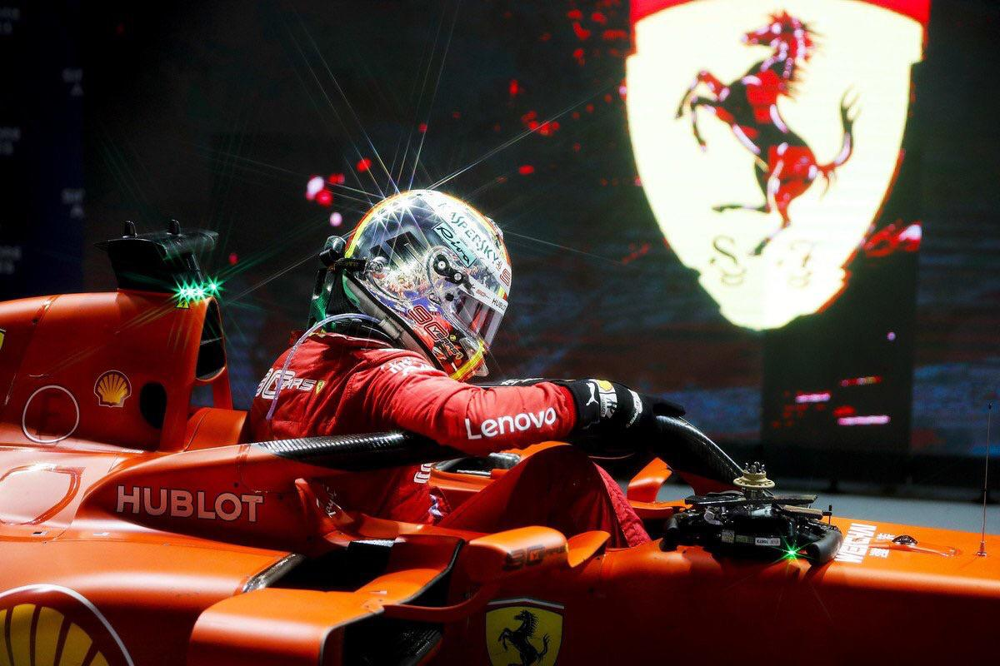

<br><br>
<span style="font-family: Courier New; font-size: 20px; font-weight: bold;">  
Multi-Variate Statistics Visualization // Exploratory Data Analysis
</span>
<br><br><br>

<span style="font-family: Courier New; font-size: 18px; font-weight: bold;">  
Uni-Variate Statistics Visualization // Exploratory Data Analysis
</span>
<br><br><br>

/var/folders/w8/d9x92py92j792gw_1kyfc8sh0000gn/T/ipykernel_49673/1565427905.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(timedf_eda_uni, kde = True, color = "b", ax = axes[0, 1]) # distplot for averagelaptime
/var/folders/w8/d9x92py92j792gw_1kyfc8sh0000gn/T/ipykernel_49673/1565427905.py:16: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/d

<Axes: >

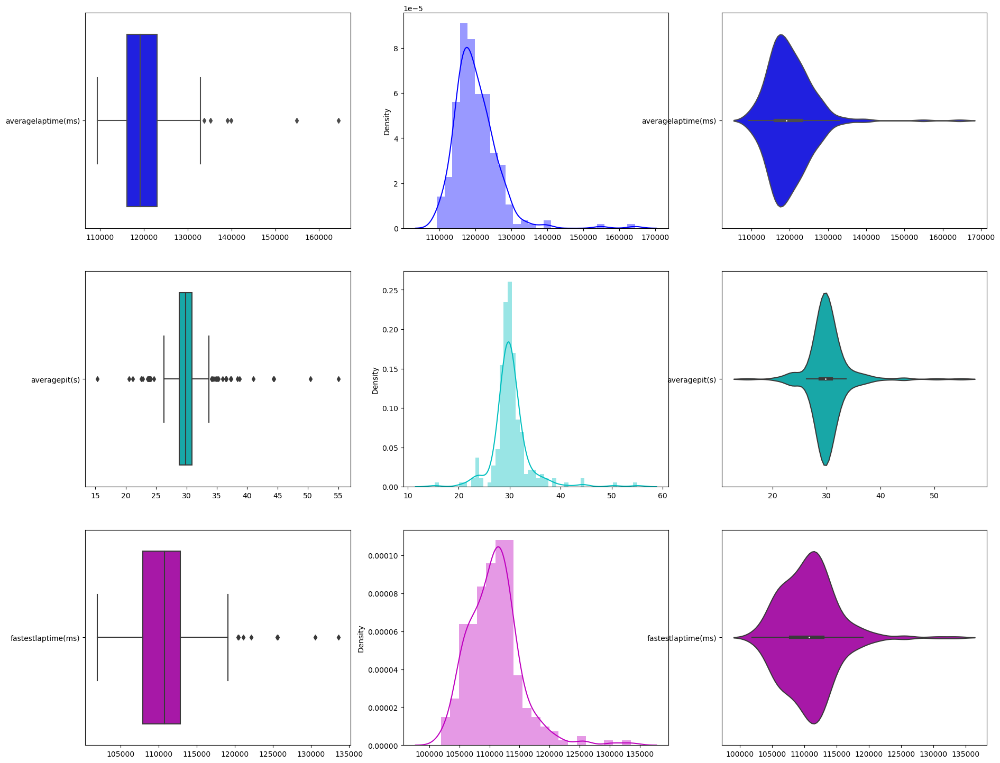

In [12]:
# uni-variate visualisation for timedf, pitdf and fastestdf

f, axes = plt.subplots(3, 3, figsize=(22,18))

# uni-variate visualisation for timedf eda

timedf_eda_uni = pd.DataFrame(timedf[["averagelaptime(ms)"]])
sb.boxplot(timedf_eda_uni, orient = "h", color = "b", ax = axes[0, 0]) # boxplot for averagelaptime
sb.distplot(timedf_eda_uni, kde = True, color = "b", ax = axes[0, 1]) # distplot for averagelaptime
sb.violinplot(timedf_eda_uni, orient = "h", color = "b", ax = axes[0, 2]) # violinplot for averagelaptime

# uni-variate visualisation for pitdf eda

pitdf_eda_uni = pd.DataFrame(pitdf[["averagepit(s)"]])
sb.boxplot(pitdf_eda_uni, orient = "h", color = "c", ax = axes[1, 0]) # boxplot for averagelaptime
sb.distplot(pitdf_eda_uni, kde = True, color = "c", ax = axes[1, 1]) # distplot for averagelaptime
sb.violinplot(pitdf_eda_uni, orient = "h", color = "c", ax = axes[1, 2]) # violinplot for averagelaptime

# uni-variate visualisation for fastestdf eda

fastestdf_eda_uni = pd.DataFrame(fastestdf[["fastestlaptime(ms)"]])
sb.boxplot(fastestdf_eda_uni, orient = "h", color = "m", ax = axes[2, 0]) # boxplot for averagelaptime
sb.distplot(fastestdf_eda_uni, kde = True, color = "m", ax = axes[2, 1]) # distplot for averagelaptime
sb.violinplot(fastestdf_eda_uni, orient = "h", color = "m", ax = axes[2, 2]) # violinplot for averagelaptime

Number of Grid Positions:  24
grid
1       13
2       13
3       13
4       13
5       13
6       13
7       13
8       13
9       13
10      13
11      13
12      13
13      13
14      13
15      13
16      13
17      13
18      13
19      13
20      13
21       6
22       6
23       3
24       3
Name: count, dtype: int64


/Users/adisontan/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


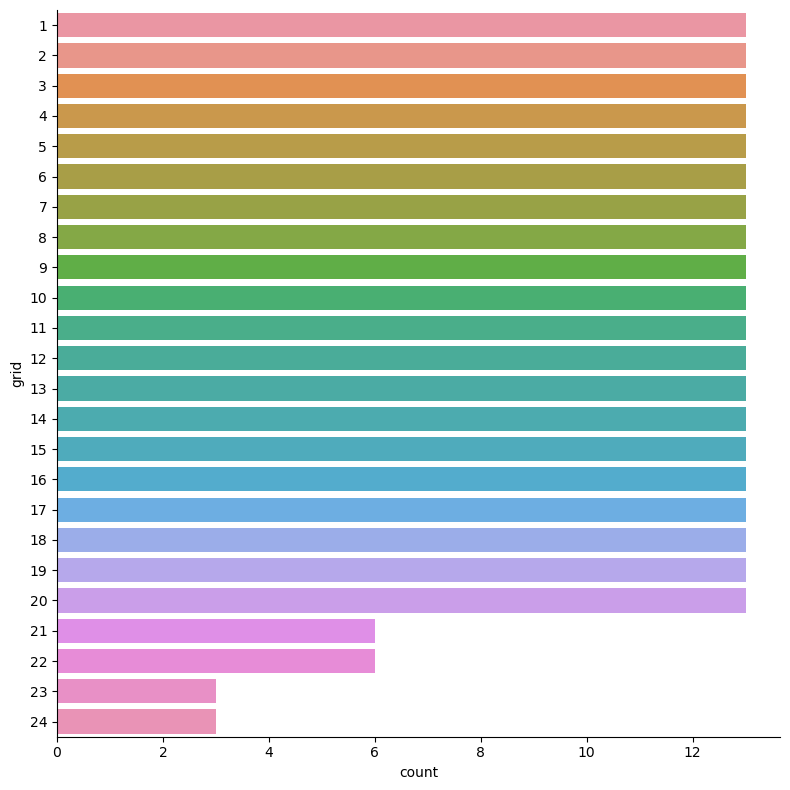

In [13]:
# uni-variate visualisation for griddf eda

griddf_eda_uni = pd.DataFrame(griddf[["grid"]])

# number of categories in the dataframe

print("Number of Grid Positions: ", len(griddf_eda_uni["grid"].unique()))

# frequencies of each category

print(griddf_eda_uni.value_counts().sort_index())
sb.catplot(y = "grid", data = griddf_eda_uni, kind = "count", height = 8) # 2010, 2011, 2012 has 24 drivers. 2013, 2014, 2016 has 22 drivers.

<Axes: xlabel='weather', ylabel='count'>

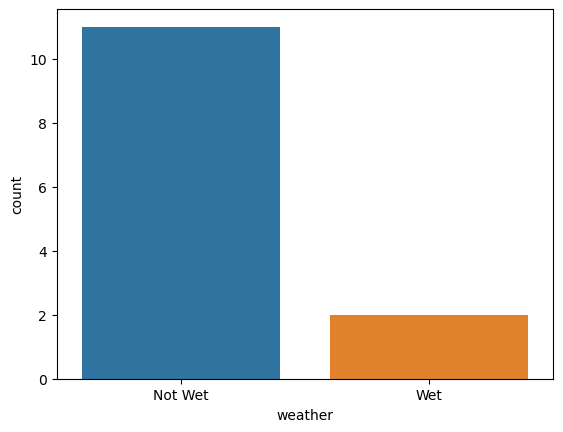

In [14]:
# uni-variate visualisation for weatherdf eda

sb.countplot(sgpweather, x="weather")

<br><br>
<span style="font-family: Courier New; font-size: 18px; font-weight: bold;">  
Bi-Variate Statistics Visualization // Exploratory Data Analysis
</span>
<br><br><br>

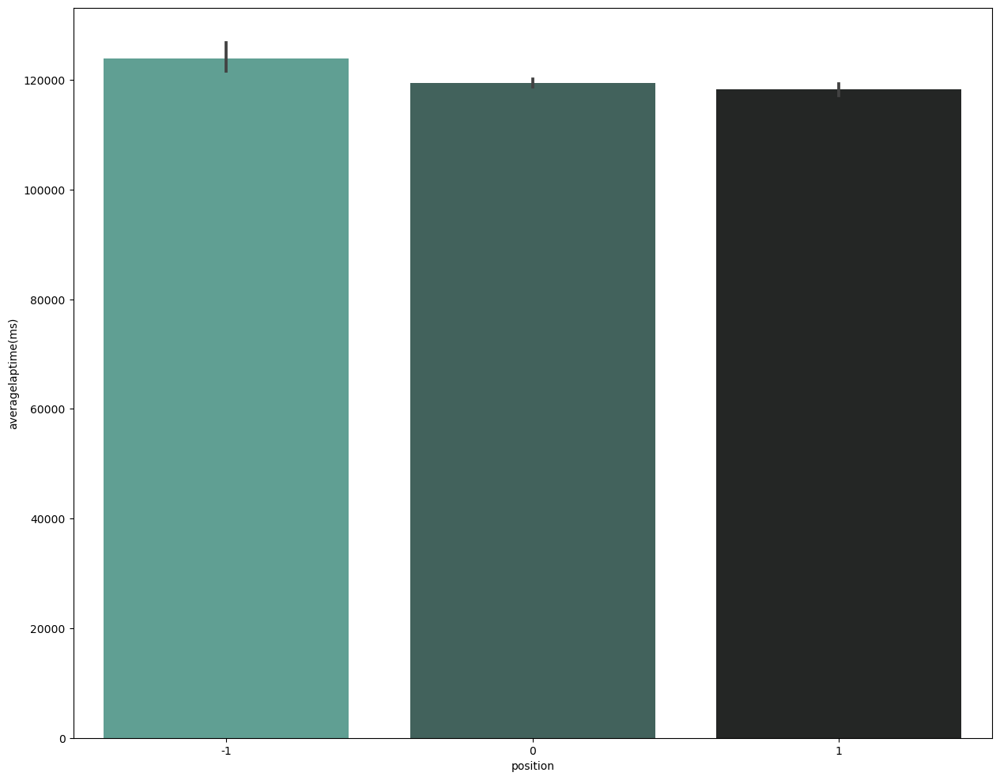

In [15]:
# heatmap for fastestdf, fastestlaptime against position eda

plt.figure(figsize=(15, 12))
timedf_eda_uni2 = pd.DataFrame(timedf[["averagelaptime(ms)", "position"]])
sb.barplot(x = 'position', y = 'averagelaptime(ms)', data = timedf_eda_uni2, palette="dark:#5A9_r")
plt.show()

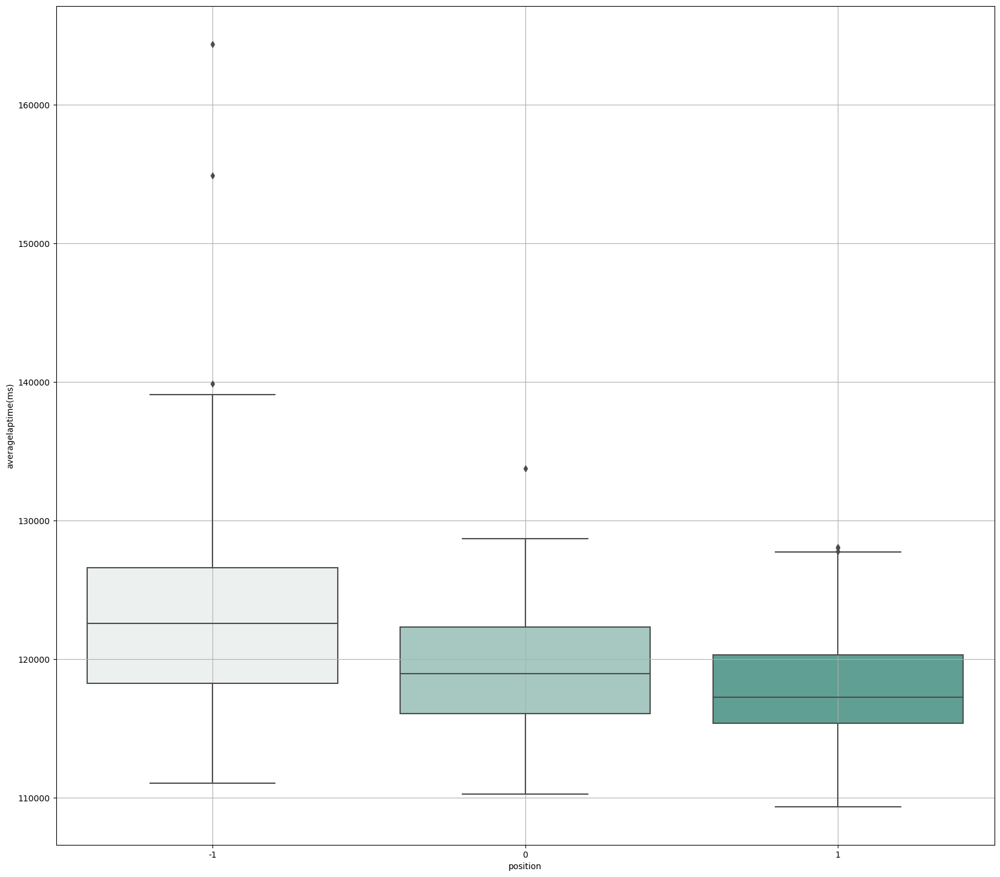

In [16]:
# boxplot for timedf, averagelaptime(ms) against position eda

plt.figure(figsize=(20, 18))
timedf_eda_uni2 = sb.boxplot(y=timedf["averagelaptime(ms)"], x=timedf['position'], width=0.8, palette="light:#5A9")
plt.grid(True)
plt.show()

<Axes: xlabel='position', ylabel='averagepit(s)'>

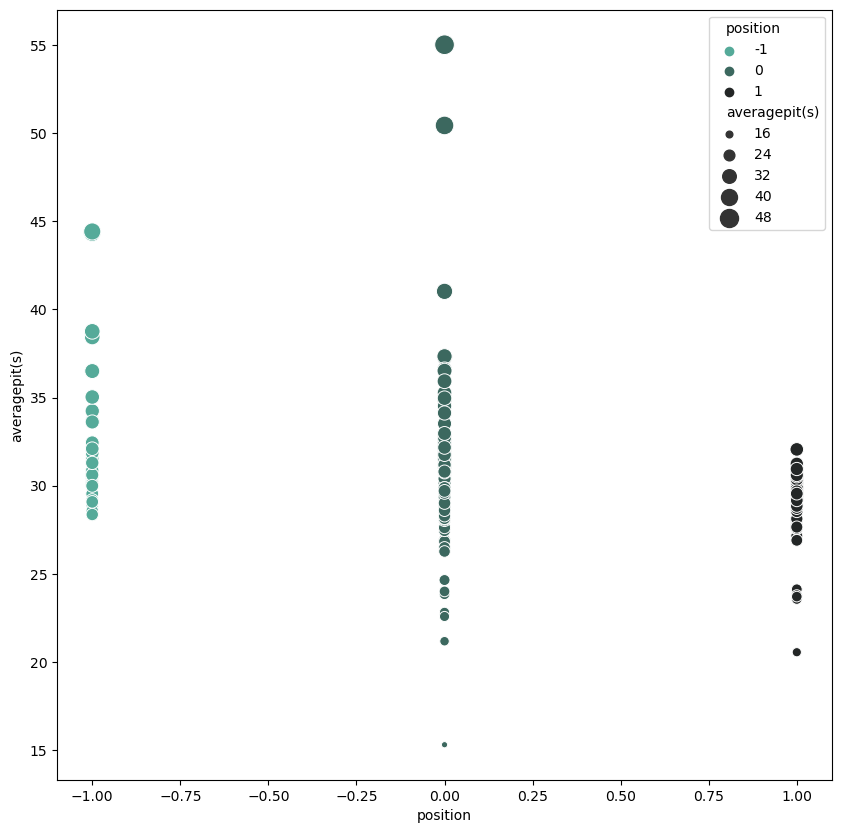

In [17]:
# scatterplot for pitdf, averagepit(s) vs position

f = plt.figure(figsize=(10, 10))
sb.scatterplot(x = 'position', y = 'averagepit(s)', hue="position", palette="dark:#5A9_r", size="averagepit(s)", sizes=(20, 200), data = pitdf)

<Axes: xlabel='grid', ylabel='position'>

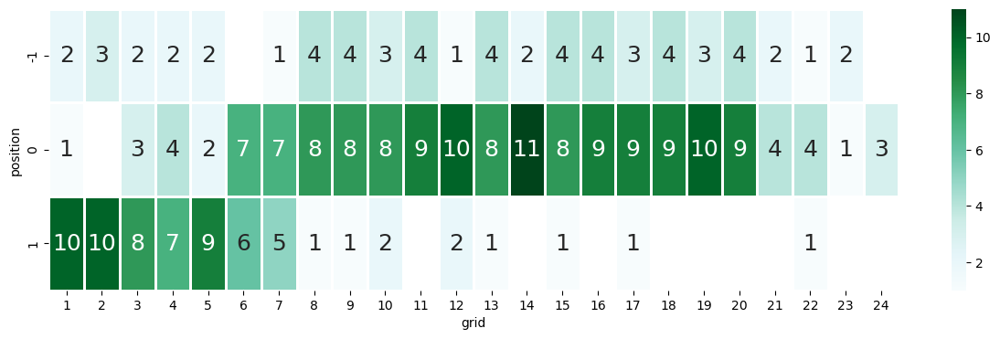

In [18]:
# heatmap for griddf, grid against position eda

f = plt.figure(figsize=(15, 4))
sb.heatmap(griddf.groupby(['position', 'grid']).size().unstack(), 
           linewidths = 1, annot = True, fmt = 'g', annot_kws = {"size": 18}, cmap = "BuGn")

/var/folders/w8/d9x92py92j792gw_1kyfc8sh0000gn/T/ipykernel_49673/2441438781.py:12: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sb.catplot(data = balanced_data, x = "weather", y= "averagelaptime(ms)", palette="dark:#5A9_r")
/Users/adisontan/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


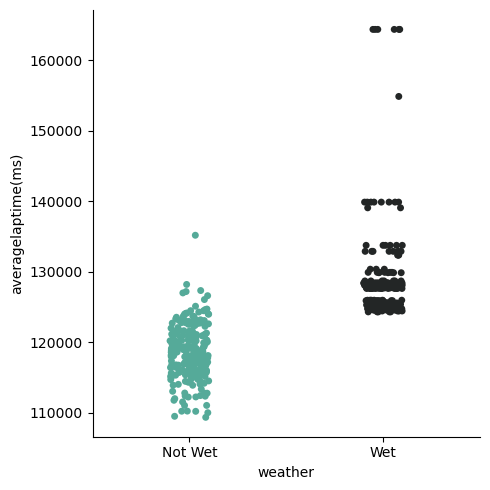

In [19]:
# catplot for weatherdf, weather against averagelaptime(ms)

# random sampling for visualization of relationship

from sklearn.utils import resample

minority_class = weatherdf[weatherdf['weather'] == 'Wet']
majority_class = weatherdf[weatherdf['weather'] == 'Not Wet']
minority_upsampled = resample(minority_class, replace=True, n_samples=len(majority_class), random_state=42) # upsample the minority class
balanced_data = pd.concat([majority_class, minority_upsampled]) # combine the upsampled minority class with the majority class

sb.catplot(data = balanced_data, x = "weather", y= "averagelaptime(ms)", palette="dark:#5A9_r")

<br><br>
<span style="font-family: Courier New; font-size: 18px; font-weight: bold;">  
Multi-Variate Statistics Visualization // Exploratory Data Analysis
</span>
<br><br><br>

In [20]:
# merge the variables from different dataframes into one dataframe, mergedf

merge_df1 = pd.merge(pitdf, timedf, on=['driverId', 'raceId'], how='outer')
merge_df2 = pd.merge(merge_df1, fastestdf, on=['driverId', 'raceId'], how='outer')
merge_df2 = pd.DataFrame(merge_df2[['driverId', 'raceId', 'averagepit(s)', 'averagelaptime(ms)', 'fastestlaptime(ms)']])
merge_df3 = pd.merge(merge_df2, griddf, on=['driverId', 'raceId'], how='outer')
mergedf = pd.DataFrame(merge_df3[['averagepit(s)', 'averagelaptime(ms)', 'fastestlaptime(ms)', 'grid', 'position']])

/var/folders/w8/d9x92py92j792gw_1kyfc8sh0000gn/T/ipykernel_49673/3202192651.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(mergedf[var], ax = axes[count,0])
/var/folders/w8/d9x92py92j792gw_1kyfc8sh0000gn/T/ipykernel_49673/3202192651.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(mergedf[

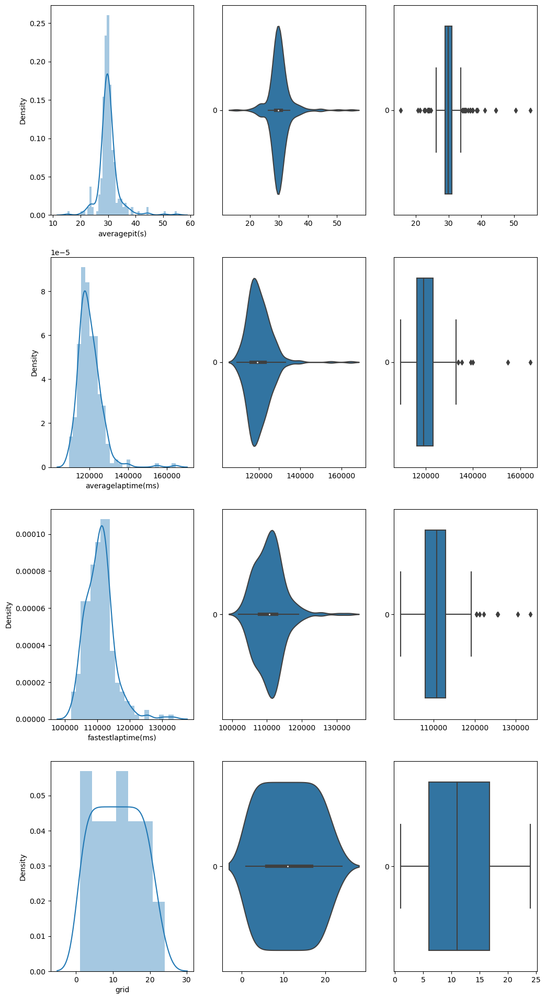

In [21]:
# distplot, violinplot, boxplot for mergedf

f, axes = plt.subplots(4, 3, figsize=(12,24))

count = 0 
for var in mergedf:
    if (count != 4):
        sb.distplot(mergedf[var], ax = axes[count,0]) 
        sb.violinplot(mergedf[var], ax = axes[count,1], orient = "h") 
        sb.boxplot(mergedf[var], ax = axes[count,2], orient = "h") 
        count += 1

/Users/adisontan/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


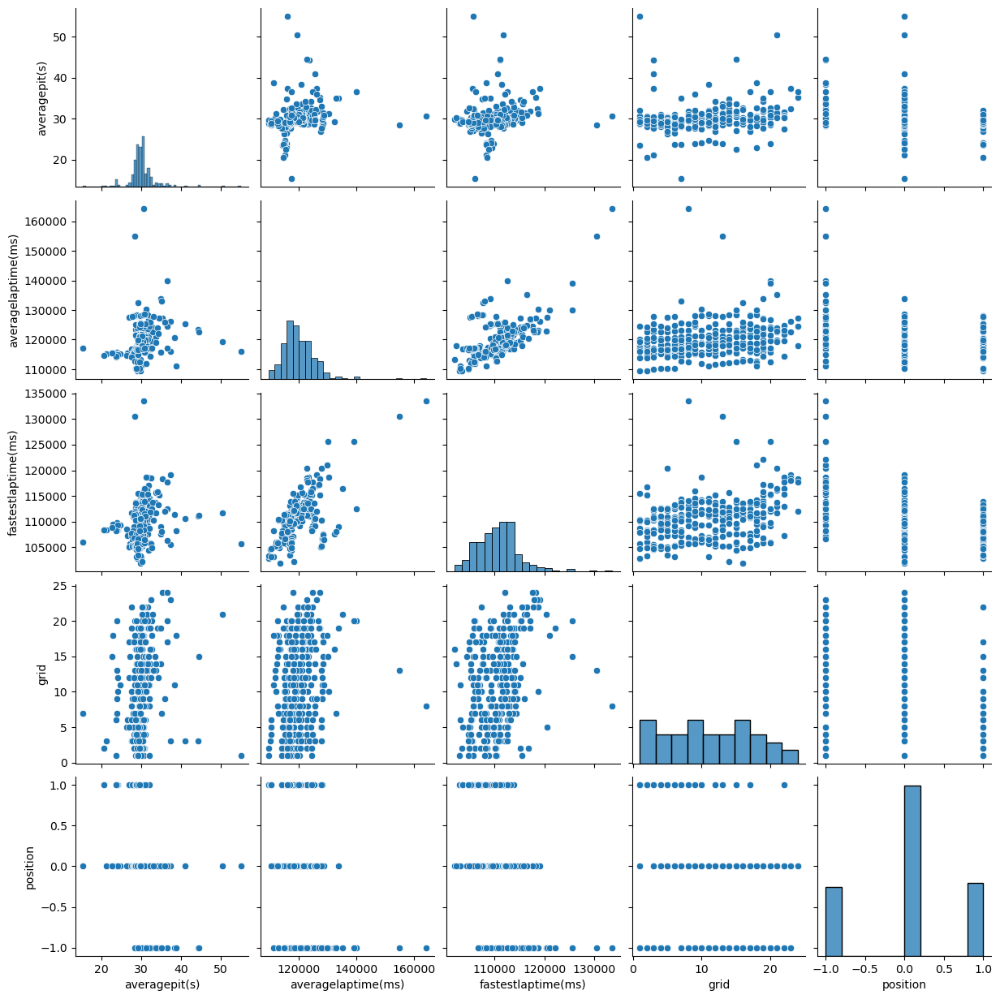

In [22]:
# pairplot for mergedf

sb.pairplot(data = mergedf)

<Axes: >

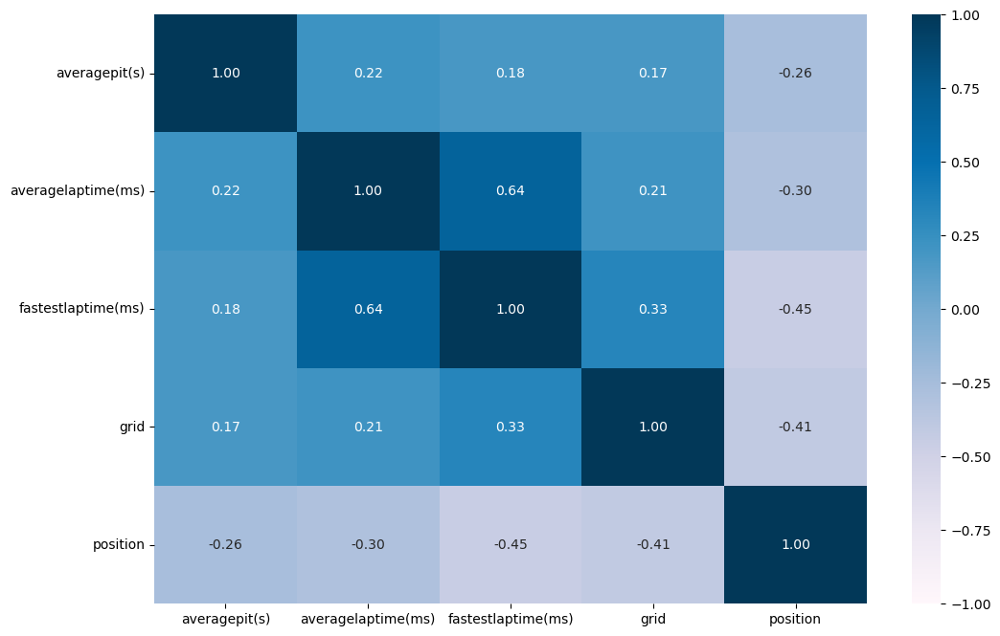

In [23]:
# heatmap for mergedf

f, axes = plt.subplots(1, 1, figsize=(12, 8))
sb.heatmap(mergedf.corr(), vmin = -1, vmax = 1, annot = True, fmt =".2f", cmap = "PuBu") # heatmap allowed us to differentiate the variables that we may have otherwised missed out in the corr matrix

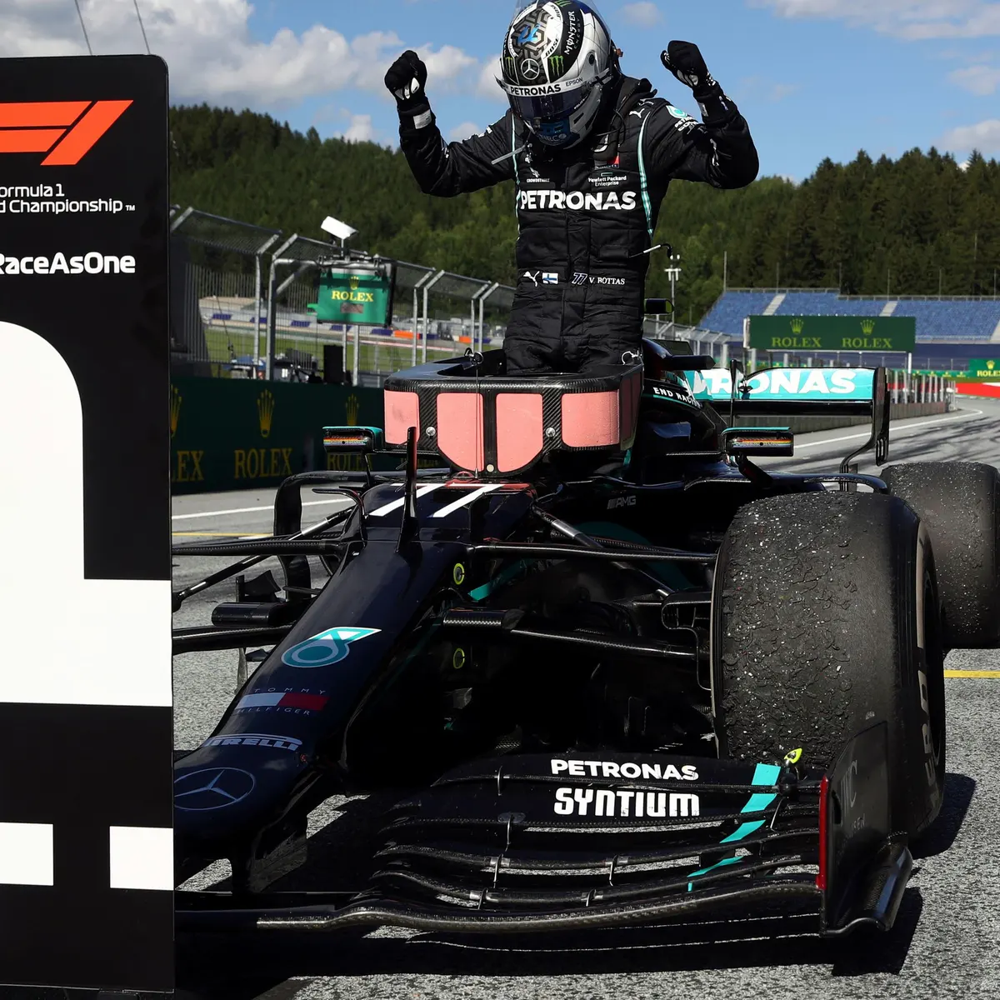

<br><br>
<span style="font-family: Courier New; font-size: 25px; font-weight: bold;">  
Machine Learning Models
</span>
<br><br><br>

<span style="font-family: Courier New; font-size: 18px; font-weight: bold;">  
Upsampling // Machine Learning
</span>
<br><br>

In [24]:
# remove null values for model and extract single variables for machine learning

mldf = mergedf.dropna(axis=0)

# change the position of the drivers to show top 5 , not top 5. 

mldf.loc[mldf['position'] == -1, 'position'] = 0 # set DNF to 0
mldf['position'] = mldf['position'].astype(str).astype(int)
for i in mldf['position']:
    if (i >= 1 and i <= 5): 
        mldf.loc[mldf['position'] == i, 'position'] = 1 # set drivers who finish in top 5 to 1
    elif (i <= 0):
        continue
    elif (i > 5 and i <= 22):
        mldf[mldf['position'] == i, 'position'] = 0 # set drivers who finish outside of top 5 to 0

/var/folders/w8/d9x92py92j792gw_1kyfc8sh0000gn/T/ipykernel_49673/1530388821.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mldf['position'] = mldf['position'].astype(str).astype(int)


position
0    177
1    177
Name: count, dtype: int64


/Users/adisontan/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


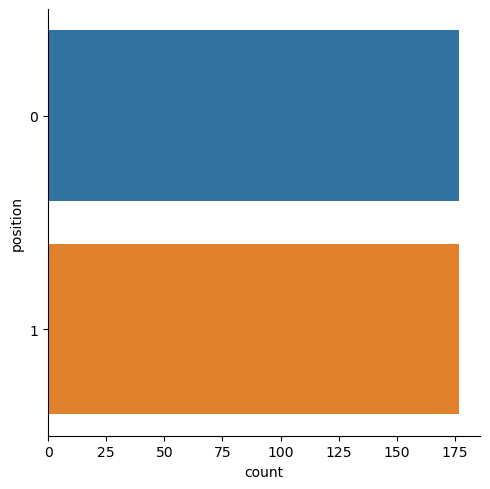

In [25]:
# upsample Top 5 to meet Not Top 5

from sklearn.utils import resample

top5 = mldf[mldf.position == 1]
nottop5 = mldf[mldf.position == 0]
 
# sample the Top 5 samples
top5_up = resample(top5, 
                        replace=True,                     
                        n_samples=nottop5.shape[0])    
 
# combine the two classes back after upsampling
mldf_up = pd.concat([nottop5, top5_up])
 
# check the ratio of the classes
print(mldf_up['position'].value_counts())

# quick plot to check the balanced classes visually
sb.catplot(y = 'position', data = mldf_up, kind = "count")

<br><br>
<span style="font-family: Courier New; font-size: 18px; font-weight: bold;">  
One-Hot Encoding (OHE) // Machine Learning
</span>
<br><br><br>

In [26]:
# import the encoder from sklearn

from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder()

# OneHotEncoding of categorical predictors, grid (not the response)

mergedf_cat = mldf[['grid']]
ohe.fit(mergedf_cat)
mergedf_cat_ohe = pd.DataFrame(ohe.transform(mergedf_cat).toarray(), 
                                  columns=ohe.get_feature_names_out(mergedf_cat.columns))

# check the encoded variables

mergedf_cat_ohe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 237 entries, 0 to 236
Data columns (total 24 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   grid_1   237 non-null    float64
 1   grid_2   237 non-null    float64
 2   grid_3   237 non-null    float64
 3   grid_4   237 non-null    float64
 4   grid_5   237 non-null    float64
 5   grid_6   237 non-null    float64
 6   grid_7   237 non-null    float64
 7   grid_8   237 non-null    float64
 8   grid_9   237 non-null    float64
 9   grid_10  237 non-null    float64
 10  grid_11  237 non-null    float64
 11  grid_12  237 non-null    float64
 12  grid_13  237 non-null    float64
 13  grid_14  237 non-null    float64
 14  grid_15  237 non-null    float64
 15  grid_16  237 non-null    float64
 16  grid_17  237 non-null    float64
 17  grid_18  237 non-null    float64
 18  grid_19  237 non-null    float64
 19  grid_20  237 non-null    float64
 20  grid_21  237 non-null    float64
 21  grid_22  237 non

In [27]:
# combining numeric features, averagepit(s), averagelaptime(ms), fastestlaptime(ms), with the OHE Categorical features

mergedf_num = mldf[['averagepit(s)', 'averagelaptime(ms)', 'fastestlaptime(ms)']]
mergedf_res = mldf['position']

# we see here we concatenate the numerical df mergedf_num, the categorical data mergedf_cat_ohe as well as the response variable mergedf_res

mergedf_ohe = pd.concat([mergedf_num, mergedf_cat_ohe, mergedf_res], 
                           sort = False, axis = 1).reindex(index=mergedf_num.index)

# check the final dataframe
mergedf_ohe.info()

<class 'pandas.core.frame.DataFrame'>
Index: 237 entries, 0 to 236
Data columns (total 28 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   averagepit(s)       237 non-null    float64
 1   averagelaptime(ms)  237 non-null    float64
 2   fastestlaptime(ms)  237 non-null    float64
 3   grid_1              237 non-null    float64
 4   grid_2              237 non-null    float64
 5   grid_3              237 non-null    float64
 6   grid_4              237 non-null    float64
 7   grid_5              237 non-null    float64
 8   grid_6              237 non-null    float64
 9   grid_7              237 non-null    float64
 10  grid_8              237 non-null    float64
 11  grid_9              237 non-null    float64
 12  grid_10             237 non-null    float64
 13  grid_11             237 non-null    float64
 14  grid_12             237 non-null    float64
 15  grid_13             237 non-null    float64
 16  grid_14      

In [28]:
# defining predictor and response variables for ML with OHE

ohe_pred = mergedf_ohe.drop('position', axis = 1)
ohe_res = mergedf_res
print(ohe_pred.info())
print()
print(ohe_res.info())

<class 'pandas.core.frame.DataFrame'>
Index: 237 entries, 0 to 236
Data columns (total 27 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   averagepit(s)       237 non-null    float64
 1   averagelaptime(ms)  237 non-null    float64
 2   fastestlaptime(ms)  237 non-null    float64
 3   grid_1              237 non-null    float64
 4   grid_2              237 non-null    float64
 5   grid_3              237 non-null    float64
 6   grid_4              237 non-null    float64
 7   grid_5              237 non-null    float64
 8   grid_6              237 non-null    float64
 9   grid_7              237 non-null    float64
 10  grid_8              237 non-null    float64
 11  grid_9              237 non-null    float64
 12  grid_10             237 non-null    float64
 13  grid_11             237 non-null    float64
 14  grid_12             237 non-null    float64
 15  grid_13             237 non-null    float64
 16  grid_14      

In [29]:
# defining predictor and response variables for ML with upsampling

mldf_up_pred = mldf_up.drop('position', axis = 1)
mldf_up_res = mldf_up['position']
print(mldf_up_pred.info())
print()
print(mldf_up_res.info())

<class 'pandas.core.frame.DataFrame'>
Index: 354 entries, 0 to 50
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   averagepit(s)       354 non-null    float64
 1   averagelaptime(ms)  354 non-null    float64
 2   fastestlaptime(ms)  354 non-null    float64
 3   grid                354 non-null    int64  
dtypes: float64(3), int64(1)
memory usage: 13.8 KB
None

<class 'pandas.core.series.Series'>
Index: 354 entries, 0 to 50
Series name: position
Non-Null Count  Dtype
--------------  -----
354 non-null    int64
dtypes: int64(1)
memory usage: 5.5 KB
None


In [30]:
# function defintion for calculating tp, tn, fp and fn rates

def rate(num, den):
    rate = num/(num+den)
    return rate

<br><br>
<span style="font-family: Courier New; font-size: 25px; font-weight: bold;">  
Support Vector Machine (SVM) // Machine Learning
</span>
<br><br><br>

<span style="font-family: Courier New; font-size: 18px; font-weight: bold;">  
SVM with One-Hot Encoder (OHE) // Machine Learning
</span>
<br><br>

In [31]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import cross_val_score
def SVM(X, y, test_size = 0.25, cv = 10):
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=42)
    
    # Initialize the Logistic Regression model
    model = SVC()
    
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Make predictions on the test data
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    print("Support Vector Classification: \n")
    
    # Calculate cross-validation score
    cv_scores = cross_val_score(model, X, y, cv=cv)
    
    # Print cross-validation score
    print("Cross-Validation Scores:", cv_scores)
    print("Mean Accuracy:", np.mean(cv_scores))
    print()
    
    
    # Print classification report
    print("Classification Report:")
    print(classification_report(y_test, y_test_pred))
    print()
    
    
    tntrain, fptrain, fntrain, tptrain = confusion_matrix(y_train, y_train_pred).ravel()
    tntest, fptest, fntest, tptest = confusion_matrix(y_test, y_test_pred).ravel()

    print("\t\t Train Dataset")
    print("Classification Accuracy\t\t:", model.score(X_train, y_train))
    print()

    print("\t\t Test Dataset")
    print("Classification Accuracy\t\t:", model.score(X_test, y_test))
    print()

    print("\t\t Train Dataset")
    print("True Positive Rate\t\t:", rate(tptrain, tntrain))
    print()

    print("\t\t Test Dataset")
    print("True Positive Rate\t\t:", rate(tptest, tntest))
    print()

    print("\t\t Train Dataset")
    print("False Positive Rate\t\t:", rate(fptrain, fntrain))
    print()

    print("\t\t Test Dataset")
    print("False Positive Rate\t\t:", rate(fptest, fntest))
    print()
    print()
    
    # Print confusion matrix
    print("Confusion Matrix:")
    f, axes = plt.subplots(1, 2, figsize=(12, 4))
    sb.heatmap(confusion_matrix(y_train, y_train_pred),
                annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0], cmap="PuBu")
    sb.heatmap(confusion_matrix(y_test, y_test_pred), 
                annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1], cmap="PuBu")

Support Vector Classification: 

Cross-Validation Scores: [0.75       0.75       0.75       0.75       0.75       0.75
 0.75       0.73913043 0.73913043 0.73913043]
Mean Accuracy: 0.7467391304347826

Classification Report:
              precision    recall  f1-score   support

           0       0.75      1.00      0.86        45
           1       0.00      0.00      0.00        15

    accuracy                           0.75        60
   macro avg       0.38      0.50      0.43        60
weighted avg       0.56      0.75      0.64        60


		 Train Dataset
Classification Accuracy		: 0.7457627118644068

		 Test Dataset
Classification Accuracy		: 0.75

		 Train Dataset
True Positive Rate		: 0.0

		 Test Dataset
True Positive Rate		: 0.0

		 Train Dataset
False Positive Rate		: 0.0

		 Test Dataset
False Positive Rate		: 0.0


Confusion Matrix:


/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


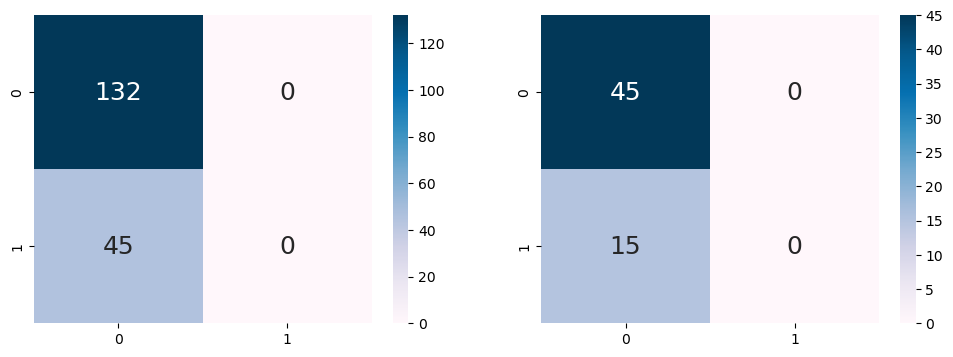

In [32]:
SVM(ohe_pred, ohe_res)

<br><br>
<span style="font-family: Courier New; font-size: 18px; font-weight: bold;">  
SVM with Upsampling // Machine Learning
</span>
<br><br><br>

Support Vector Classification: 



/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Cross-Validation Scores: [0.47222222 0.52777778 0.52777778 0.5        0.48571429 0.48571429
 0.48571429 0.45714286 0.48571429 0.54285714]
Mean Accuracy: 0.497063492063492

Classification Report:
              precision    recall  f1-score   support

           0       0.48      1.00      0.65        43
           1       0.00      0.00      0.00        46

    accuracy                           0.48        89
   macro avg       0.24      0.50      0.33        89
weighted avg       0.23      0.48      0.31        89


		 Train Dataset
Classification Accuracy		: 0.5132075471698113

		 Test Dataset
Classification Accuracy		: 0.48314606741573035

		 Train Dataset
True Positive Rate		: 0.022058823529411766

		 Test Dataset
True Positive Rate		: 0.0

		 Train Dataset
False Positive Rate		: 0.007751937984496124

		 Test Dataset
False Positive Rate		: 0.0


Confusion Matrix:


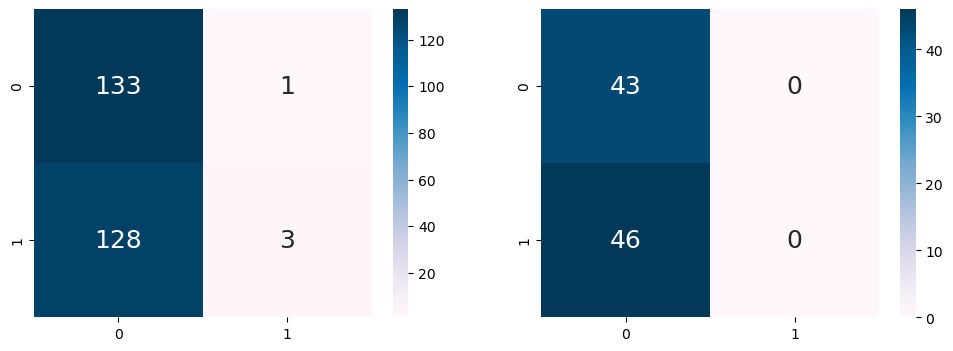

In [33]:
SVM(mldf_up_pred, mldf_up_res)

<br><br>
<span style="font-family: Courier New; font-size: 18px; font-weight: bold;">  
SVM with GridSearchCV // Machine Learning
</span>
<br><br><br>

In [34]:
# Increasing the accuracy of the models by optimising the parameters using GridSearchCV

from sklearn.svm import SVC

X_train, X_test, y_train, y_test = train_test_split(mldf_up_pred, mldf_up_res, test_size=0.25, random_state=42)

svm_model = SVC()

# Make a dictionary of hyperparameters values to search

search_space = {
    'kernel' : ['rbf', 'poly', 'sigmoid', 'linear'],
    'C' : [0.1, 1, 100, 1000],
    'degree' : [1,3,5,7,9]
}

In [35]:
from sklearn.model_selection import GridSearchCV

# Make a gridsearch object

GS = GridSearchCV(estimator = svm_model,
                 param_grid = search_space,
                 scoring = ['f1', 'accuracy', 'precision'],
                 refit = 'f1',
                 cv = 4,
                 n_jobs=-1)

In [36]:
GS.fit(X_train,y_train)

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classi

GridSearchCV(cv=4, estimator=SVC(), n_jobs=-1,
             param_grid={'C': [0.1, 1, 100, 1000], 'degree': [1, 3, 5, 7, 9],
                         'kernel': ['rbf', 'poly', 'sigmoid', 'linear']},
             refit='f1', scoring=['f1', 'accuracy', 'precision'])

In [37]:
print(GS.best_estimator_)

SVC(C=1000, degree=9, kernel='poly')


In [38]:
print(GS.best_score_)

0.7568906455862977


In [39]:
# Redoing the SVM with optimised parameters
def SVM2(X, y, test_size = 0.25, cv = 10):
    # Split the data into training and testing sets
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=42)
    
    # Initialize the Logistic Regression model
    model = SVC(C=1000, degree=9, kernel='poly')
    
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Make predictions on the test data
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    print("Support Vector Classification: \n")
    
    # Calculate cross-validation score
    cv_scores = cross_val_score(model, X, y, cv=cv)
    
    # Print cross-validation score
    print("Cross-Validation Scores:", cv_scores)
    print("Mean Accuracy:", np.mean(cv_scores))
    print()
    
    
    # Print classification report
    print("Classification Report:")
    print(classification_report(y_test, y_test_pred))
    print()
    
    
    tntrain, fptrain, fntrain, tptrain = confusion_matrix(y_train, y_train_pred).ravel()
    tntest, fptest, fntest, tptest = confusion_matrix(y_test, y_test_pred).ravel()

    print("\t\t Train Dataset")
    print("Classification Accuracy\t\t:", model.score(X_train, y_train))
    print()

    print("\t\t Test Dataset")
    print("Classification Accuracy\t\t:", model.score(X_test, y_test))
    print()

    print("\t\t Train Dataset")
    print("True Positive Rate\t\t:", rate(tptrain, tntrain))
    print()

    print("\t\t Test Dataset")
    print("True Positive Rate\t\t:", rate(tptest, tntest))
    print()

    print("\t\t Train Dataset")
    print("False Positive Rate\t\t:", rate(fptrain, fntrain))
    print()

    print("\t\t Test Dataset")
    print("False Positive Rate\t\t:", rate(fptest, fntest))
    print()
    print()
    
    # Print confusion matrix
    print("Confusion Matrix:")
    f, axes = plt.subplots(1, 2, figsize=(12, 4))
    sb.heatmap(confusion_matrix(y_train, y_train_pred),
                annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0], cmap="PuBu")
    sb.heatmap(confusion_matrix(y_test, y_test_pred), 
                annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1], cmap="PuBu")

Support Vector Classification: 

Cross-Validation Scores: [0.58333333 0.83333333 0.94444444 0.91666667 0.82857143 0.8
 0.94285714 0.54285714 0.42857143 0.57142857]
Mean Accuracy: 0.7392063492063492

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.67      0.75        43
           1       0.75      0.89      0.81        46

    accuracy                           0.79        89
   macro avg       0.80      0.78      0.78        89
weighted avg       0.80      0.79      0.78        89


		 Train Dataset
Classification Accuracy		: 0.7886792452830189

		 Test Dataset
Classification Accuracy		: 0.7865168539325843

		 Train Dataset
True Positive Rate		: 0.5885167464114832

		 Test Dataset
True Positive Rate		: 0.5857142857142857

		 Train Dataset
False Positive Rate		: 0.8571428571428571

		 Test Dataset
False Positive Rate		: 0.7368421052631579


Confusion Matrix:


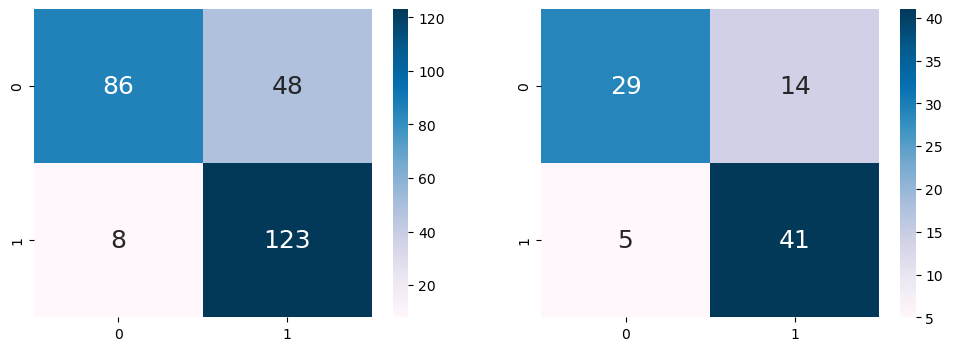

In [40]:
SVM2(mldf_up_pred, mldf_up_res)

<br><br>
<span style="font-family: Courier New; font-size: 25px; font-weight: bold;">  
Logistic Regression // Machine Learning
</span>
<br><br><br>

In [41]:
def LogisticRegression(X, y, test_size = 0.25, cv = 10):
    from sklearn.model_selection import train_test_split
    from sklearn.linear_model import LogisticRegression
    from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
    from sklearn.model_selection import cross_val_score
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=42)
    
    # Initialize the Logistic Regression model
    model = LogisticRegression()
    
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Make predictions on the test data
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    print("Logistic Regression: \n")
    
    # Calculate cross-validation score
    cv_scores = cross_val_score(model, X, y, cv=cv)
    
    # Print cross-validation score
    print("Cross-Validation Scores:", cv_scores)
    print("Mean Accuracy:", np.mean(cv_scores))
    print()
    
    
    # Print classification report
    print("Classification Report:")
    print(classification_report(y_test, y_test_pred))
    print()
    
    
    tntrain, fptrain, fntrain, tptrain = confusion_matrix(y_train, y_train_pred).ravel()
    tntest, fptest, fntest, tptest = confusion_matrix(y_test, y_test_pred).ravel()

    print("\t\t Train Dataset")
    print("Classification Accuracy\t\t:", model.score(X_train, y_train))
    print()

    print("\t\t Test Dataset")
    print("Classification Accuracy\t\t:", model.score(X_test, y_test))
    print()

    print("\t\t Train Dataset")
    print("True Positive Rate\t\t:", rate(tptrain, tntrain))
    print()

    print("\t\t Test Dataset")
    print("True Positive Rate\t\t:", rate(tptest, tntest))
    print()

    print("\t\t Train Dataset")
    print("False Positive Rate\t\t:", rate(fptrain, fntrain))
    print()

    print("\t\t Test Dataset")
    print("False Positive Rate\t\t:", rate(fptest, fntest))
    print()
    print()
    
    # Print confusion matrix
    print("Confusion Matrix:")
    f, axes = plt.subplots(1, 2, figsize=(12, 4))
    sb.heatmap(confusion_matrix(y_train, y_train_pred),
                annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0], cmap="PuBu")
    sb.heatmap(confusion_matrix(y_test, y_test_pred), 
                annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1], cmap="PuBu")

<br><br>
<span style="font-family: Courier New; font-size: 18px; font-weight: bold;">  
Logistic Regression with OHE // Machine Learning
</span>
<br><br><br>

Logistic Regression: 

Cross-Validation Scores: [0.75       0.75       0.75       0.75       0.75       0.75
 0.75       0.34782609 0.73913043 0.73913043]
Mean Accuracy: 0.7076086956521739

Classification Report:
              precision    recall  f1-score   support

           0       0.75      1.00      0.86        45
           1       0.00      0.00      0.00        15

    accuracy                           0.75        60
   macro avg       0.38      0.50      0.43        60
weighted avg       0.56      0.75      0.64        60


		 Train Dataset
Classification Accuracy		: 0.7401129943502824

		 Test Dataset
Classification Accuracy		: 0.75

		 Train Dataset
True Positive Rate		: 0.0

		 Test Dataset
True Positive Rate		: 0.0

		 Train Dataset
False Positive Rate		: 0.021739130434782608

		 Test Dataset
False Positive Rate		: 0.0


Confusion Matrix:


/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


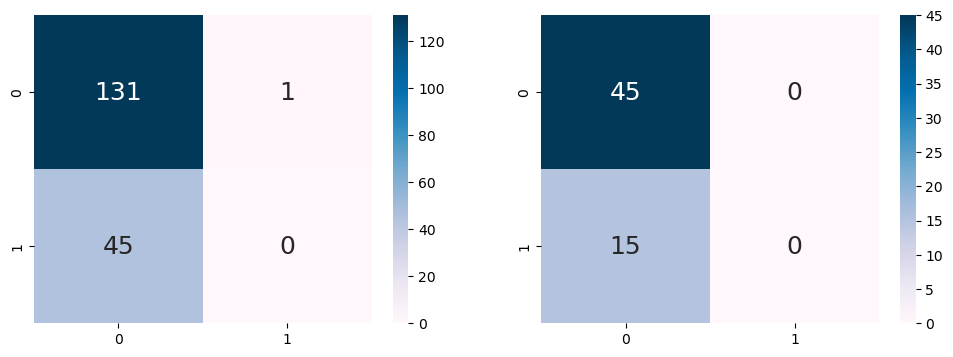

In [42]:
LogisticRegression(ohe_pred, ohe_res)

<br><br>
<span style="font-family: Courier New; font-size: 18px; font-weight: bold;">  
Logistic Regression with Upsampling // Machine Learning
</span>
<br><br><br>

Logistic Regression: 

Cross-Validation Scores: [0.66666667 0.91666667 0.88888889 0.88888889 0.85714286 0.74285714
 0.71428571 0.74285714 0.85714286 0.8       ]
Mean Accuracy: 0.8075396825396824

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.81      0.83        43
           1       0.83      0.87      0.85        46

    accuracy                           0.84        89
   macro avg       0.84      0.84      0.84        89
weighted avg       0.84      0.84      0.84        89


		 Train Dataset
Classification Accuracy		: 0.8377358490566038

		 Test Dataset
Classification Accuracy		: 0.8426966292134831

		 Train Dataset
True Positive Rate		: 0.527027027027027

		 Test Dataset
True Positive Rate		: 0.5333333333333333

		 Train Dataset
False Positive Rate		: 0.6744186046511628

		 Test Dataset
False Positive Rate		: 0.5714285714285714


Confusion Matrix:


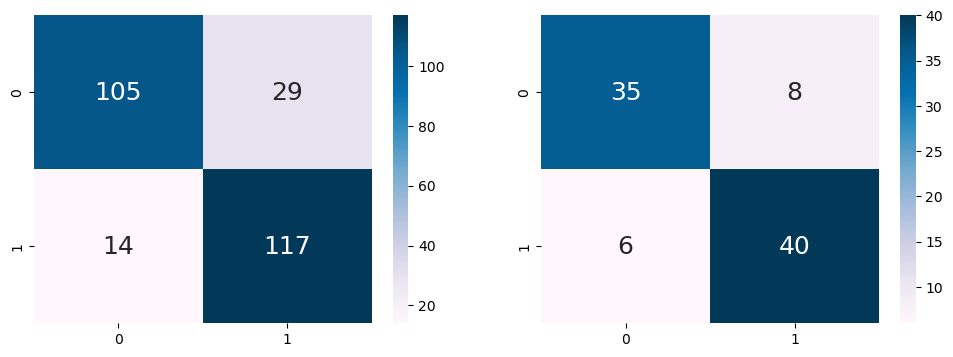

In [43]:
LogisticRegression(mldf_up_pred, mldf_up_res)

<br><br>
<span style="font-family: Courier New; font-size: 18px; font-weight: bold;">  
Logistic Regression with GridSearchCV // Machine Learning
</span>
<br><br><br>

In [44]:
# Increasing the accuracy of the models by optimising the parameters using GridSearchCV

from sklearn.linear_model import LogisticRegression

X_train, X_test, y_train, y_test = train_test_split(mldf_up_pred, mldf_up_res, test_size=0.25, random_state=42)

log_model = LogisticRegression()

# Make a dictionary of hyperparameters values to search
# we do not include penalty none to prevent overfitting
search_space2 = {
    'penalty' : ['l1', 'l2', 'elasticnet'],
    'C' : np.logspace(-4, 4, 20),
    'max_iter' : [100, 1000, 2500, 5000],
    'solver' : ['lbfgs', 'newton-cg', 'liblinear', 'sag', 'saga']
}

In [45]:
from sklearn.model_selection import GridSearchCV

# Make a gridsearch object
GS2 = GridSearchCV(estimator = log_model,
                 param_grid = search_space2,
                 scoring = ['f1', 'accuracy', 'precision'],
                 refit = 'f1',
                 cv = 4,
                 verbose = 4,
                 n_jobs=-1)

In [46]:
GS2.fit(X_train, y_train)

Fitting 4 folds for each of 1200 candidates, totalling 4800 fits


/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn

[CV 4/4] END C=0.0001, max_iter=100, penalty=l1, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=0.0001, max_iter=100, penalty=l2, solver=saga; accuracy: (test=0.537) f1: (test=0.340) precision: (test=0.571) total time=   0.0s
[CV 2/4] END C=0.0001, max_iter=100, penalty=l2, solver=saga; accuracy: (test=0.545) f1: (test=0.348) precision: (test=0.615) total time=   0.0s
[CV 1/4] END C=0.0001, max_iter=1000, penalty=l1, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 2/4] END C=0.0001, max_iter=1000, penalty=l1, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 3/4] END C=0.0001, max_iter=1000, penalty=l1, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 4/4] END C=0.0001, max_iter=1000, penalty=l1, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4]

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-

[CV 2/4] END C=0.0001, max_iter=100, penalty=l1, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 3/4] END C=0.0001, max_iter=100, penalty=l1, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=0.0001, max_iter=100, penalty=l1, solver=liblinear; accuracy: (test=0.522) f1: (test=0.200) precision: (test=0.571) total time=   0.0s
[CV 3/4] END C=0.0001, max_iter=100, penalty=l2, solver=lbfgs; accuracy: (test=0.758) f1: (test=0.750) precision: (test=0.774) total time=   0.0s
[CV 4/4] END C=0.0001, max_iter=100, penalty=l2, solver=lbfgs; accuracy: (test=0.803) f1: (test=0.806) precision: (test=0.771) total time=   0.0s
[CV 3/4] END C=0.0001, max_iter=100, penalty=l2, solver=sag; accuracy: (test=0.530) f1: (test=0.367) precision: (test=0.562) total time=   0.0s
[CV 4/4] END C=0.0001, max_iter=100, penalty=l2, solver=sag; accuracy: (test=0.500) f1: (test=0.327) precision: (test=0.471) total

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/sit

[CV 3/4] END C=0.0001, max_iter=100, penalty=l1, solver=liblinear; accuracy: (test=0.515) f1: (test=0.304) precision: (test=0.538) total time=   0.0s
[CV 3/4] END C=0.0001, max_iter=100, penalty=l2, solver=saga; accuracy: (test=0.530) f1: (test=0.367) precision: (test=0.562) total time=   0.0s
[CV 4/4] END C=0.0001, max_iter=100, penalty=l2, solver=saga; accuracy: (test=0.500) f1: (test=0.327) precision: (test=0.471) total time=   0.0s
[CV 1/4] END C=0.0001, max_iter=1000, penalty=l2, solver=liblinear; accuracy: (test=0.746) f1: (test=0.767) precision: (test=0.700) total time=   0.0s
[CV 2/4] END C=0.0001, max_iter=1000, penalty=l2, solver=liblinear; accuracy: (test=0.712) f1: (test=0.667) precision: (test=0.792) total time=   0.0s
[CV 3/4] END C=0.0001, max_iter=1000, penalty=l2, solver=liblinear; accuracy: (test=0.758) f1: (test=0.750) precision: (test=0.774) total time=   0.0s
[CV 4/4] END C=0.0001, max_iter=1000, penalty=l2, solver=liblinear; accuracy: (test=0.803) f1: (test=0.806)

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/sit

[CV 1/4] END C=0.0001, max_iter=100, penalty=l1, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 4/4] END C=0.0001, max_iter=100, penalty=l1, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=0.0001, max_iter=100, penalty=l1, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 2/4] END C=0.0001, max_iter=100, penalty=l1, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=0.0001, max_iter=100, penalty=l1, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 3/4] END C=0.0001, max_iter=100, penalty=l1, solver=saga; accuracy: (test=0.515) f1: (test=0.304) precision: (test=0.538) total time=   0.0s
[CV 4/4] END C=0.0001, max_iter=100, penalty=l1, solver=saga; accuracy: (test=0.561) f1: (test=0.356) precision: (test=0.615) total time=   0.0s
[CV 

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_i

[CV 4/4] END C=0.0001, max_iter=100, penalty=l1, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 2/4] END C=0.0001, max_iter=100, penalty=l1, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 3/4] END C=0.0001, max_iter=100, penalty=l1, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=0.0001, max_iter=100, penalty=l1, solver=saga; accuracy: (test=0.522) f1: (test=0.200) precision: (test=0.571) total time=   0.0s
[CV 2/4] END C=0.0001, max_iter=100, penalty=l1, solver=saga; accuracy: (test=0.455) f1: (test=0.100) precision: (test=0.286) total time=   0.0s
[CV 3/4] END C=0.0001, max_iter=100, penalty=l2, solver=liblinear; accuracy: (test=0.758) f1: (test=0.750) precision: (test=0.774) total time=   0.0s
[CV 4/4] END C=0.0001, max_iter=100, penalty=l2, solver=liblinear; accuracy: (test=0.803) f1: (test=0.806) precision: (test=0.771) total tim

/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not con

[CV 2/4] END C=0.0001, max_iter=100, penalty=l1, solver=liblinear; accuracy: (test=0.455) f1: (test=0.100) precision: (test=0.286) total time=   0.0s
[CV 3/4] END C=0.0001, max_iter=100, penalty=l2, solver=newton-cg; accuracy: (test=0.667) f1: (test=0.656) precision: (test=0.677) total time=   0.1s
[CV 4/4] END C=0.0001, max_iter=100, penalty=l2, solver=newton-cg; accuracy: (test=0.697) f1: (test=0.697) precision: (test=0.676) total time=   0.1s
[CV 1/4] END C=0.0001, max_iter=2500, penalty=elasticnet, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 2/4] END C=0.0001, max_iter=2500, penalty=elasticnet, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 3/4] END C=0.0001, max_iter=2500, penalty=elasticnet, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 4/4] END C=0.0001, max_iter=2500, penalty=elasticnet, solver=lbfgs; accuracy: (test=nan) f1: (test=

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not con

[CV 3/4] END C=0.012742749857031334, max_iter=2500, penalty=l1, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 4/4] END C=0.012742749857031334, max_iter=2500, penalty=l1, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=0.012742749857031334, max_iter=2500, penalty=l1, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 2/4] END C=0.012742749857031334, max_iter=2500, penalty=l1, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 3/4] END C=0.012742749857031334, max_iter=2500, penalty=l1, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 4/4] END C=0.012742749857031334, max_iter=2500, penalty=l1, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=0.012742749857031334, max_iter=2500, pe

/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:425: LineSearchWarning: Rounding errors prevent the line search from converging
  wa

[CV 4/4] END C=0.00026366508987303583, max_iter=5000, penalty=l2, solver=liblinear; accuracy: (test=0.833) f1: (test=0.841) precision: (test=0.784) total time=   0.0s
[CV 1/4] END C=0.00026366508987303583, max_iter=5000, penalty=l2, solver=sag; accuracy: (test=0.537) f1: (test=0.340) precision: (test=0.571) total time=   0.1s
[CV 2/4] END C=0.00026366508987303583, max_iter=5000, penalty=l2, solver=sag; accuracy: (test=0.545) f1: (test=0.348) precision: (test=0.615) total time=   0.1s
[CV 3/4] END C=0.00026366508987303583, max_iter=5000, penalty=l2, solver=sag; accuracy: (test=0.530) f1: (test=0.367) precision: (test=0.562) total time=   0.1s
[CV 4/4] END C=0.00026366508987303583, max_iter=5000, penalty=l2, solver=sag; accuracy: (test=0.500) f1: (test=0.327) precision: (test=0.471) total time=   0.1s
[CV 1/4] END C=0.00026366508987303583, max_iter=5000, penalty=l2, solver=saga; accuracy: (test=0.537) f1: (test=0.340) precision: (test=0.571) total time=   0.1s
[CV 2/4] END C=0.0002636650

/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not con

[CV 4/4] END C=0.004832930238571752, max_iter=2500, penalty=elasticnet, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=0.004832930238571752, max_iter=2500, penalty=elasticnet, solver=liblinear; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 2/4] END C=0.004832930238571752, max_iter=2500, penalty=elasticnet, solver=liblinear; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 3/4] END C=0.004832930238571752, max_iter=2500, penalty=elasticnet, solver=liblinear; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 4/4] END C=0.004832930238571752, max_iter=2500, penalty=elasticnet, solver=liblinear; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=0.004832930238571752, max_iter=2500, penalty=elasticnet, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:425: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_s

[CV 4/4] END C=0.03359818286283781, max_iter=1000, penalty=elasticnet, solver=saga; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=0.03359818286283781, max_iter=2500, penalty=l1, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 2/4] END C=0.03359818286283781, max_iter=2500, penalty=l1, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 3/4] END C=0.03359818286283781, max_iter=2500, penalty=l1, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 4/4] END C=0.03359818286283781, max_iter=2500, penalty=l1, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=0.03359818286283781, max_iter=2500, penalty=l1, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 2/4] END C=0.03359818286283781, max_iter=2500, penalty=l1, so

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:425: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:425: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: L

[CV 3/4] END C=0.0018329807108324356, max_iter=100, penalty=l2, solver=liblinear; accuracy: (test=0.894) f1: (test=0.899) precision: (test=0.861) total time=   0.0s
[CV 4/4] END C=0.0018329807108324356, max_iter=100, penalty=l2, solver=liblinear; accuracy: (test=0.788) f1: (test=0.788) precision: (test=0.765) total time=   0.0s
[CV 1/4] END C=0.0018329807108324356, max_iter=5000, penalty=l1, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 2/4] END C=0.0018329807108324356, max_iter=5000, penalty=l1, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 3/4] END C=0.0018329807108324356, max_iter=5000, penalty=l1, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 4/4] END C=0.0018329807108324356, max_iter=5000, penalty=l1, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=0.0018329807108324356, max_iter=5000, p

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:425: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_mo

[CV 3/4] END C=0.23357214690901212, max_iter=100, penalty=l2, solver=newton-cg; accuracy: (test=0.909) f1: (test=0.912) precision: (test=0.886) total time=   0.0s
[CV 4/4] END C=0.23357214690901212, max_iter=100, penalty=l2, solver=newton-cg; accuracy: (test=0.848) f1: (test=0.853) precision: (test=0.806) total time=   0.0s
[CV 1/4] END C=0.23357214690901212, max_iter=100, penalty=l2, solver=liblinear; accuracy: (test=0.791) f1: (test=0.816) precision: (test=0.721) total time=   0.0s
[CV 2/4] END C=0.23357214690901212, max_iter=100, penalty=l2, solver=liblinear; accuracy: (test=0.818) f1: (test=0.829) precision: (test=0.784) total time=   0.0s
[CV 3/4] END C=0.23357214690901212, max_iter=100, penalty=l2, solver=liblinear; accuracy: (test=0.894) f1: (test=0.899) precision: (test=0.861) total time=   0.0s
[CV 4/4] END C=0.23357214690901212, max_iter=100, penalty=l2, solver=liblinear; accuracy: (test=0.788) f1: (test=0.788) precision: (test=0.765) total time=   0.0s
[CV 1/4] END C=0.23357

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:425: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(m

[CV 1/4] END C=0.23357214690901212, max_iter=2500, penalty=l2, solver=lbfgs; accuracy: (test=0.791) f1: (test=0.816) precision: (test=0.721) total time=   0.0s
[CV 2/4] END C=0.23357214690901212, max_iter=2500, penalty=l2, solver=lbfgs; accuracy: (test=0.818) f1: (test=0.824) precision: (test=0.800) total time=   0.0s
[CV 3/4] END C=0.23357214690901212, max_iter=2500, penalty=l2, solver=lbfgs; accuracy: (test=0.894) f1: (test=0.899) precision: (test=0.861) total time=   0.0s
[CV 4/4] END C=0.23357214690901212, max_iter=2500, penalty=l2, solver=lbfgs; accuracy: (test=0.803) f1: (test=0.800) precision: (test=0.788) total time=   0.0s
[CV 1/4] END C=0.615848211066026, max_iter=100, penalty=l1, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 2/4] END C=0.615848211066026, max_iter=100, penalty=l1, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 3/4] END C=0.615848211066026, max_iter=100, penalty=l1

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/sit

[CV 3/4] END C=0.08858667904100823, max_iter=5000, penalty=l1, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 4/4] END C=0.08858667904100823, max_iter=5000, penalty=l1, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=0.08858667904100823, max_iter=5000, penalty=l1, solver=saga; accuracy: (test=0.537) f1: (test=0.340) precision: (test=0.571) total time=   0.1s
[CV 2/4] END C=0.08858667904100823, max_iter=5000, penalty=l1, solver=saga; accuracy: (test=0.545) f1: (test=0.348) precision: (test=0.615) total time=   0.1s
[CV 3/4] END C=0.08858667904100823, max_iter=5000, penalty=l1, solver=saga; accuracy: (test=0.530) f1: (test=0.367) precision: (test=0.562) total time=   0.1s
[CV 4/4] END C=0.08858667904100823, max_iter=5000, penalty=l1, solver=saga; accuracy: (test=0.500) f1: (test=0.327) precision: (test=0.471) total time=   0.1s
[CV 1/4] END C=0.08858667904100823, max_iter=5000, penalty=l

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/adisontan/

[CV 2/4] END C=0.23357214690901212, max_iter=5000, penalty=elasticnet, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 3/4] END C=0.23357214690901212, max_iter=5000, penalty=elasticnet, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 4/4] END C=0.23357214690901212, max_iter=5000, penalty=elasticnet, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=0.23357214690901212, max_iter=5000, penalty=elasticnet, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 2/4] END C=0.23357214690901212, max_iter=5000, penalty=elasticnet, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 3/4] END C=0.23357214690901212, max_iter=5000, penalty=elasticnet, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 4/4] END C=0

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adis

[CV 2/4] END C=4.281332398719396, max_iter=100, penalty=l1, solver=saga; accuracy: (test=0.545) f1: (test=0.348) precision: (test=0.615) total time=   0.0s
[CV 3/4] END C=4.281332398719396, max_iter=100, penalty=l1, solver=saga; accuracy: (test=0.530) f1: (test=0.367) precision: (test=0.562) total time=   0.0s
[CV 4/4] END C=4.281332398719396, max_iter=100, penalty=l1, solver=saga; accuracy: (test=0.500) f1: (test=0.327) precision: (test=0.471) total time=   0.0s
[CV 1/4] END C=4.281332398719396, max_iter=100, penalty=l2, solver=lbfgs; accuracy: (test=0.791) f1: (test=0.816) precision: (test=0.721) total time=   0.0s
[CV 2/4] END C=4.281332398719396, max_iter=100, penalty=l2, solver=lbfgs; accuracy: (test=0.818) f1: (test=0.824) precision: (test=0.800) total time=   0.0s
[CV 3/4] END C=4.281332398719396, max_iter=100, penalty=l2, solver=lbfgs; accuracy: (test=0.894) f1: (test=0.899) precision: (test=0.861) total time=   0.0s
[CV 4/4] END C=4.281332398719396, max_iter=100, penalty=l2, s

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge'

[CV 3/4] END C=1.623776739188721, max_iter=5000, penalty=l2, solver=liblinear; accuracy: (test=0.894) f1: (test=0.899) precision: (test=0.861) total time=   0.0s
[CV 4/4] END C=1.623776739188721, max_iter=5000, penalty=l2, solver=liblinear; accuracy: (test=0.788) f1: (test=0.788) precision: (test=0.765) total time=   0.0s
[CV 1/4] END C=1.623776739188721, max_iter=5000, penalty=l2, solver=sag; accuracy: (test=0.537) f1: (test=0.340) precision: (test=0.571) total time=   0.1s
[CV 2/4] END C=1.623776739188721, max_iter=5000, penalty=l2, solver=sag; accuracy: (test=0.545) f1: (test=0.348) precision: (test=0.615) total time=   0.1s
[CV 3/4] END C=1.623776739188721, max_iter=5000, penalty=l2, solver=sag; accuracy: (test=0.530) f1: (test=0.367) precision: (test=0.562) total time=   0.1s
[CV 4/4] END C=1.623776739188721, max_iter=5000, penalty=l2, solver=sag; accuracy: (test=0.500) f1: (test=0.327) precision: (test=0.471) total time=   0.1s
[CV 1/4] END C=1.623776739188721, max_iter=5000, pen

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/sit

[CV 4/4] END C=11.288378916846883, max_iter=100, penalty=l2, solver=sag; accuracy: (test=0.500) f1: (test=0.327) precision: (test=0.471) total time=   0.0s
[CV 1/4] END C=11.288378916846883, max_iter=100, penalty=l2, solver=saga; accuracy: (test=0.537) f1: (test=0.340) precision: (test=0.571) total time=   0.0s
[CV 2/4] END C=11.288378916846883, max_iter=100, penalty=l2, solver=saga; accuracy: (test=0.545) f1: (test=0.348) precision: (test=0.615) total time=   0.0s
[CV 3/4] END C=11.288378916846883, max_iter=100, penalty=l2, solver=saga; accuracy: (test=0.530) f1: (test=0.367) precision: (test=0.562) total time=   0.0s
[CV 4/4] END C=11.288378916846883, max_iter=100, penalty=l2, solver=saga; accuracy: (test=0.500) f1: (test=0.327) precision: (test=0.471) total time=   0.0s
[CV 1/4] END C=11.288378916846883, max_iter=100, penalty=elasticnet, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 2/4] END C=11.288378916846883, max_iter=100, penalty

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

[CV 3/4] END C=4.281332398719396, max_iter=1000, penalty=l1, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 4/4] END C=4.281332398719396, max_iter=1000, penalty=l1, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=4.281332398719396, max_iter=1000, penalty=l1, solver=saga; accuracy: (test=0.537) f1: (test=0.340) precision: (test=0.571) total time=   0.0s
[CV 2/4] END C=4.281332398719396, max_iter=1000, penalty=l1, solver=saga; accuracy: (test=0.545) f1: (test=0.348) precision: (test=0.615) total time=   0.0s
[CV 3/4] END C=4.281332398719396, max_iter=1000, penalty=l1, solver=saga; accuracy: (test=0.530) f1: (test=0.367) precision: (test=0.562) total time=   0.0s
[CV 4/4] END C=4.281332398719396, max_iter=1000, penalty=l1, solver=saga; accuracy: (test=0.500) f1: (test=0.327) precision: (test=0.471) total time=   0.0s
[CV 1/4] END C=4.281332398719396, max_iter=1000, penalty=l2, solver=lbfg

/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:425: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_mo

[CV 3/4] END C=0.615848211066026, max_iter=2500, penalty=l1, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 4/4] END C=0.615848211066026, max_iter=2500, penalty=l1, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=0.615848211066026, max_iter=2500, penalty=l1, solver=liblinear; accuracy: (test=0.791) f1: (test=0.816) precision: (test=0.721) total time=   0.0s
[CV 2/4] END C=0.615848211066026, max_iter=2500, penalty=l1, solver=liblinear; accuracy: (test=0.818) f1: (test=0.829) precision: (test=0.784) total time=   0.0s
[CV 3/4] END C=0.615848211066026, max_iter=2500, penalty=l1, solver=liblinear; accuracy: (test=0.894) f1: (test=0.899) precision: (test=0.861) total time=   0.0s
[CV 4/4] END C=0.615848211066026, max_iter=2500, penalty=l1, solver=liblinear; accuracy: (test=0.788) f1: (test=0.788) precision: (test=0.765) total time=   0.0s
[CV 1/4] END C=0.615848211066026, max_it

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adis

[CV 1/4] END C=78.47599703514607, max_iter=100, penalty=l2, solver=sag; accuracy: (test=0.537) f1: (test=0.340) precision: (test=0.571) total time=   0.0s
[CV 2/4] END C=78.47599703514607, max_iter=100, penalty=l2, solver=sag; accuracy: (test=0.545) f1: (test=0.348) precision: (test=0.615) total time=   0.0s
[CV 3/4] END C=78.47599703514607, max_iter=100, penalty=l2, solver=sag; accuracy: (test=0.530) f1: (test=0.367) precision: (test=0.562) total time=   0.0s
[CV 4/4] END C=78.47599703514607, max_iter=100, penalty=l2, solver=sag; accuracy: (test=0.500) f1: (test=0.327) precision: (test=0.471) total time=   0.0s
[CV 1/4] END C=78.47599703514607, max_iter=100, penalty=l2, solver=saga; accuracy: (test=0.537) f1: (test=0.340) precision: (test=0.571) total time=   0.0s
[CV 2/4] END C=78.47599703514607, max_iter=100, penalty=l2, solver=saga; accuracy: (test=0.545) f1: (test=0.348) precision: (test=0.615) total time=   0.0s
[CV 3/4] END C=78.47599703514607, max_iter=100, penalty=l2, solver=s

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:425: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/

[CV 3/4] END C=29.763514416313132, max_iter=1000, penalty=l2, solver=lbfgs; accuracy: (test=0.894) f1: (test=0.899) precision: (test=0.861) total time=   0.0s
[CV 4/4] END C=29.763514416313132, max_iter=1000, penalty=l2, solver=lbfgs; accuracy: (test=0.803) f1: (test=0.800) precision: (test=0.788) total time=   0.0s
[CV 1/4] END C=29.763514416313132, max_iter=1000, penalty=l2, solver=newton-cg; accuracy: (test=0.836) f1: (test=0.849) precision: (test=0.775) total time=   0.1s
[CV 2/4] END C=29.763514416313132, max_iter=1000, penalty=l2, solver=newton-cg; accuracy: (test=0.803) f1: (test=0.812) precision: (test=0.778) total time=   0.1s
[CV 3/4] END C=29.763514416313132, max_iter=1000, penalty=l2, solver=newton-cg; accuracy: (test=0.909) f1: (test=0.912) precision: (test=0.886) total time=   0.1s
[CV 4/4] END C=29.763514416313132, max_iter=1000, penalty=l2, solver=newton-cg; accuracy: (test=0.848) f1: (test=0.853) precision: (test=0.806) total time=   0.1s
[CV 1/4] END C=29.763514416313

/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:425: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not c

[CV 4/4] END C=11.288378916846883, max_iter=1000, penalty=l1, solver=liblinear; accuracy: (test=0.848) f1: (test=0.853) precision: (test=0.806) total time=   0.1s
[CV 1/4] END C=11.288378916846883, max_iter=1000, penalty=l1, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 2/4] END C=11.288378916846883, max_iter=1000, penalty=l1, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 3/4] END C=11.288378916846883, max_iter=1000, penalty=l1, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 4/4] END C=11.288378916846883, max_iter=1000, penalty=l1, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=11.288378916846883, max_iter=1000, penalty=l1, solver=saga; accuracy: (test=0.537) f1: (test=0.340) precision: (test=0.571) total time=   0.0s
[CV 2/4] END C=11.288378916846883, max_iter=1000, penalty=l1, solver=saga; 

/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not conve

[CV 1/4] END C=206.913808111479, max_iter=5000, penalty=elasticnet, solver=liblinear; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 2/4] END C=206.913808111479, max_iter=5000, penalty=elasticnet, solver=liblinear; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 3/4] END C=206.913808111479, max_iter=5000, penalty=elasticnet, solver=liblinear; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 4/4] END C=206.913808111479, max_iter=5000, penalty=elasticnet, solver=liblinear; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=206.913808111479, max_iter=5000, penalty=elasticnet, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 2/4] END C=206.913808111479, max_iter=5000, penalty=elasticnet, solver=sag; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 3/4] END C=206.913808111479, m

/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_s

[CV 3/4] END C=206.913808111479, max_iter=2500, penalty=l1, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 4/4] END C=206.913808111479, max_iter=2500, penalty=l1, solver=lbfgs; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=206.913808111479, max_iter=2500, penalty=l1, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 2/4] END C=206.913808111479, max_iter=2500, penalty=l1, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 3/4] END C=206.913808111479, max_iter=2500, penalty=l1, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 4/4] END C=206.913808111479, max_iter=2500, penalty=l1, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=206.913808111479, max_iter=2500, penalty=elasticnet, solver=lbf

/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/adis

GridSearchCV(cv=4, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                         'max_iter': [100, 1000, 2500, 5000],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['lbfgs', 'newton-cg', 'liblinear', 'sag',
                                    'saga']},
             refit='f1', scoring=['f1', 'accuracy', 'precision'], verbose=4)

In [47]:
print(GS2.best_estimator_)

LogisticRegression(C=78.47599703514607, solver='newton-cg')


In [48]:
print(GS2.best_score_)

0.8635971055088703


In [73]:
# Redoing the Logistic Regression with optimised parameters

def LogisticRegression2(X, y, test_size = 0.25, cv =10):
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=42)
    
    # Initialize the Logistic Regression model
    model = LogisticRegression(C=78.47599703514607, solver='newton-cg')
    
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Make predictions on the test data
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    print("Logistic Regression: \n")
    
    # Calculate cross-validation score
    cv_scores = cross_val_score(model, X, y, cv=cv)
    
    # Print cross-validation score
    print("Cross-Validation Scores:", cv_scores)
    print("Mean Accuracy:", np.mean(cv_scores))
    print()
    
    
    # Print classification report
    print("Classification Report:")
    print(classification_report(y_test, y_test_pred))
    print()
    
    
    tntrain, fptrain, fntrain, tptrain = confusion_matrix(y_train, y_train_pred).ravel()
    tntest, fptest, fntest, tptest = confusion_matrix(y_test, y_test_pred).ravel()

    print("\t\t Train Dataset")
    print("Classification Accuracy\t\t:", model.score(X_train, y_train))
    print()

    print("\t\t Test Dataset")
    print("Classification Accuracy\t\t:", model.score(X_test, y_test))
    print()

    print("\t\t Train Dataset")
    print("True Positive Rate\t\t:", rate(tptrain, tntrain))
    print()

    print("\t\t Test Dataset")
    print("True Positive Rate\t\t:", rate(tptest, tntest))
    print()

    print("\t\t Train Dataset")
    print("False Positive Rate\t\t:", rate(fptrain, fntrain))
    print()

    print("\t\t Test Dataset")
    print("False Positive Rate\t\t:", rate(fptest, fntest))
    print()
    print()
    
    # Print confusion matrix
    print("Confusion Matrix:")
    f, axes = plt.subplots(1, 2, figsize=(12, 4))
    sb.heatmap(confusion_matrix(y_train, y_train_pred),
                annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0], cmap="PuBu")
    sb.heatmap(confusion_matrix(y_test, y_test_pred), 
                annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1], cmap="PuBu")

/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm 

Logistic Regression: 

Cross-Validation Scores: [0.75       0.86111111 0.91666667 0.94444444 0.88571429 0.8
 0.85714286 0.71428571 0.82857143 0.82857143]
Mean Accuracy: 0.8386507936507936

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.88      0.88        43
           1       0.89      0.89      0.89        46

    accuracy                           0.89        89
   macro avg       0.89      0.89      0.89        89
weighted avg       0.89      0.89      0.89        89


		 Train Dataset
Classification Accuracy		: 0.8528301886792453

		 Test Dataset
Classification Accuracy		: 0.8876404494382022

		 Train Dataset
True Positive Rate		: 0.5309734513274337

		 Test Dataset
True Positive Rate		: 0.5189873417721519

		 Train Dataset
False Positive Rate		: 0.717948717948718

		 Test Dataset
False Positive Rate		: 0.5


Confusion Matrix:


/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/adisontan/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(


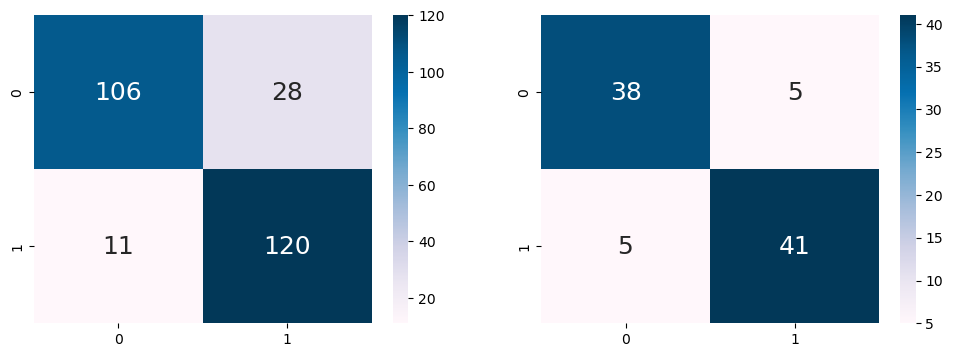

In [74]:
LogisticRegression2(mldf_up_pred, mldf_up_res)

<br><br>
<span style="font-family: Courier New; font-size: 25px; font-weight: bold;">  
Uni-Variate Classification Tree // Machine Learning
</span>
<br><br><br>

In [51]:
# extract uni-variables for uni-variate classification tree

pos_ml = pd.DataFrame(mldf[['position']])
time_ml = pd.DataFrame(mldf[['averagelaptime(ms)']])
pit_ml = pd.DataFrame(mldf[['averagepit(s)']])
fastest_ml = pd.DataFrame(mldf[['fastestlaptime(ms)']])
grid_ml =  pd.DataFrame(mldf[['grid']])

In [52]:
from sklearn.metrics import confusion_matrix 

# function definition for classification tree model

def classtreemodel(preddf, respdf, depth, confuse, tree, testsize): # function depth is for depth of tree, tree is to decide if you want to print tree together with metrics, test size is to decide train:test
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.model_selection import train_test_split
    from sklearn.tree import plot_tree
    
    X_train, X_test, y_train, y_test = train_test_split(preddf, respdf, test_size = testsize)

    # Decision Tree using Train Data
    dectree = DecisionTreeClassifier(max_depth = depth)  # create the decision tree object
    dectree.fit(X_train, y_train)                    # train the decision tree model

    # Predict Response corresponding to Predictors
    y_train_pred = dectree.predict(X_train)
    y_test_pred = dectree.predict(X_test)
    
    if (confuse == True):
        f, axes = plt.subplots(1, 2, figsize=(12, 4))
        sb.heatmap(confusion_matrix(y_train, y_train_pred),
                   annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0], cmap="PuBu")
        sb.heatmap(confusion_matrix(y_test, y_test_pred), 
                   annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1], cmap="PuBu")
    
    if (tree == True):
        f = plt.figure(figsize=(23,10))
        plot_tree(dectree, filled=True, rounded=True, 
                  feature_names=X_train.columns.tolist(), 
                  class_names=['Not Top 5','Top 5'])
        
        tntrain, fptrain, fntrain, tptrain = confusion_matrix(y_train, y_train_pred).ravel()
        tntest, fptest, fntest, tptest = confusion_matrix(y_test, y_test_pred).ravel()

        print("\t\t Train Dataset")
        print("Classification Accuracy\t\t:", dectree.score(X_train, y_train))
        print()

        print("\t\t Test Dataset")
        print("Classification Accuracy\t\t:", dectree.score(X_test, y_test))
        print()

        print("\t\t Train Dataset")
        print("True Positive Rate\t\t:", rate(tptrain, fntrain))
        print()

        print("\t\t Test Dataset")
        print("True Positive Rate\t\t:", rate(tptest, fntest))
        print()

        print("\t\t Train Dataset")
        print("True Negative Rate\t\t:", rate(tntrain, fptrain))
        print()

        print("\t\t Test Dataset")
        print("True Negative Rate\t\t:", rate(tntest, fptest))
        print()

        print("\t\t Train Dataset")
        print("False Positive Rate\t\t:", rate(fptrain, tntrain))
        print()

        print("\t\t Test Dataset")
        print("False Positive Rate\t\t:", rate(fptest, tntest))
        print()

        print("\t\t Train Dataset")
        print("False Negative Rate\t\t:", rate(fntrain, tptrain))
        print()

        print("\t\t Test Dataset")
        print("False Negative Rate\t\t:", rate(fntest, tptest))
        print()

		 Train Dataset
Classification Accuracy		: 0.8192090395480226

		 Test Dataset
Classification Accuracy		: 0.75

		 Train Dataset
True Positive Rate		: 0.5681818181818182

		 Test Dataset
True Positive Rate		: 0.25

		 Train Dataset
True Negative Rate		: 0.9022556390977443

		 Test Dataset
True Negative Rate		: 0.9318181818181818

		 Train Dataset
False Positive Rate		: 0.09774436090225563

		 Test Dataset
False Positive Rate		: 0.06818181818181818

		 Train Dataset
False Negative Rate		: 0.4318181818181818

		 Test Dataset
False Negative Rate		: 0.75



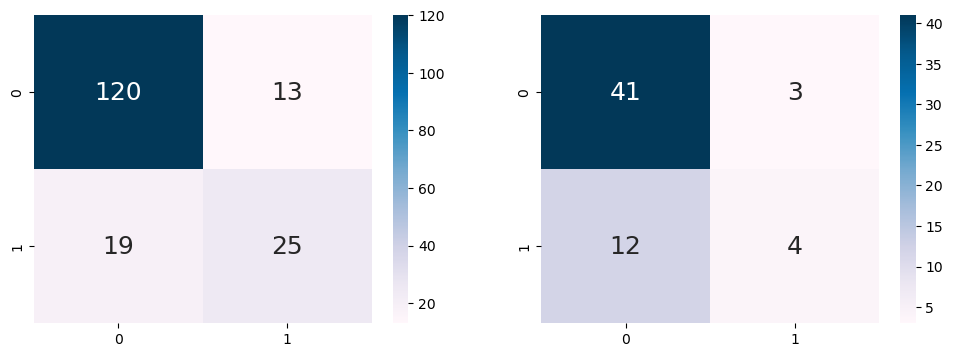

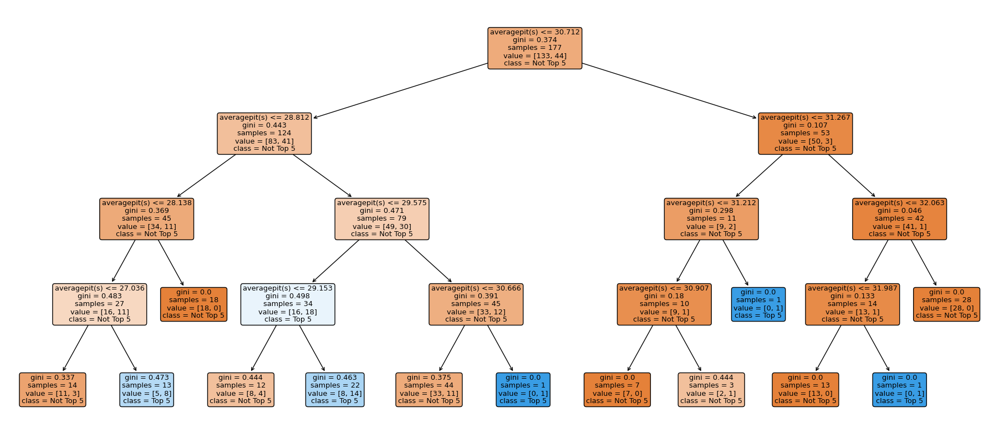

In [53]:
# classification tree for pitdf vs position

classtreemodel(pit_ml, pos_ml, 4, True, True, 0.25) # we define we want depth of 4, we want the class tree, we want the confusion matrix and we want a train:test ratio of 0.25

		 Train Dataset
Classification Accuracy		: 0.7457627118644068

		 Test Dataset
Classification Accuracy		: 0.8333333333333334

		 Train Dataset
True Positive Rate		: 0.1568627450980392

		 Test Dataset
True Positive Rate		: 0.2222222222222222

		 Train Dataset
True Negative Rate		: 0.9841269841269841

		 Test Dataset
True Negative Rate		: 0.9411764705882353

		 Train Dataset
False Positive Rate		: 0.015873015873015872

		 Test Dataset
False Positive Rate		: 0.058823529411764705

		 Train Dataset
False Negative Rate		: 0.8431372549019608

		 Test Dataset
False Negative Rate		: 0.7777777777777778



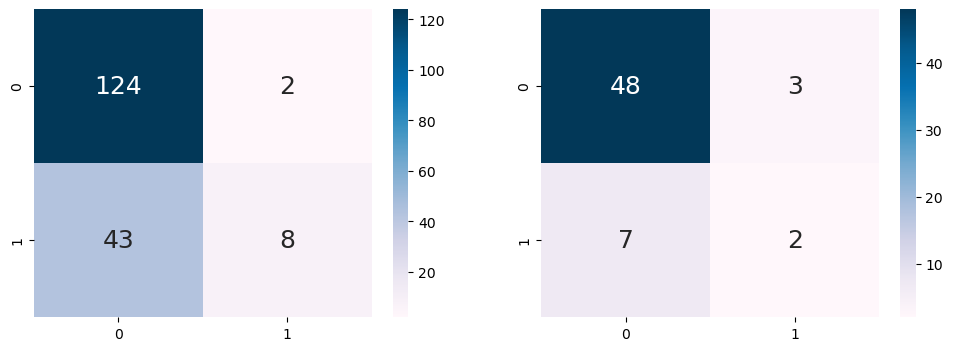

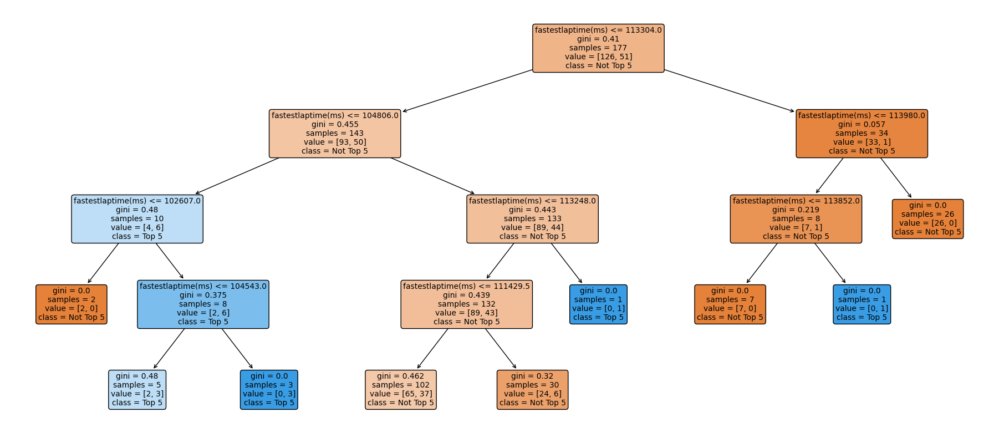

In [54]:
# classification tree for fastestdf vs position

classtreemodel(fastest_ml, pos_ml, 4, True, True, 0.25) # we define we want depth of 4, we want the class tree, we want the confusion matrix and we want a train:test ratio of 0.25

		 Train Dataset
Classification Accuracy		: 0.8305084745762712

		 Test Dataset
Classification Accuracy		: 0.8

		 Train Dataset
True Positive Rate		: 0.35555555555555557

		 Test Dataset
True Positive Rate		: 0.26666666666666666

		 Train Dataset
True Negative Rate		: 0.9924242424242424

		 Test Dataset
True Negative Rate		: 0.9777777777777777

		 Train Dataset
False Positive Rate		: 0.007575757575757576

		 Test Dataset
False Positive Rate		: 0.022222222222222223

		 Train Dataset
False Negative Rate		: 0.6444444444444445

		 Test Dataset
False Negative Rate		: 0.7333333333333333



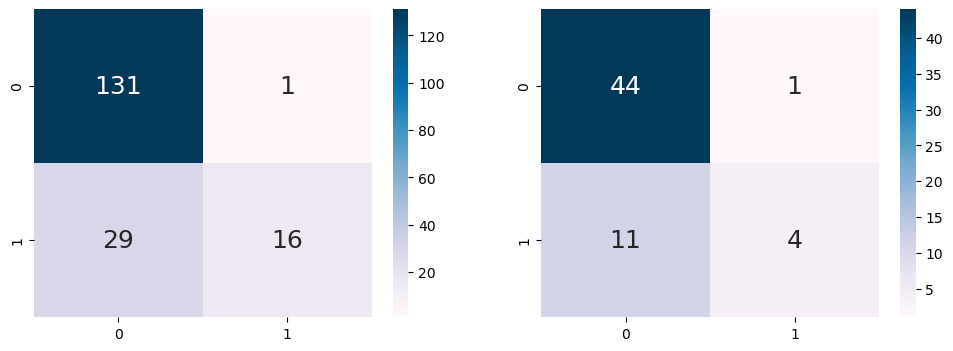

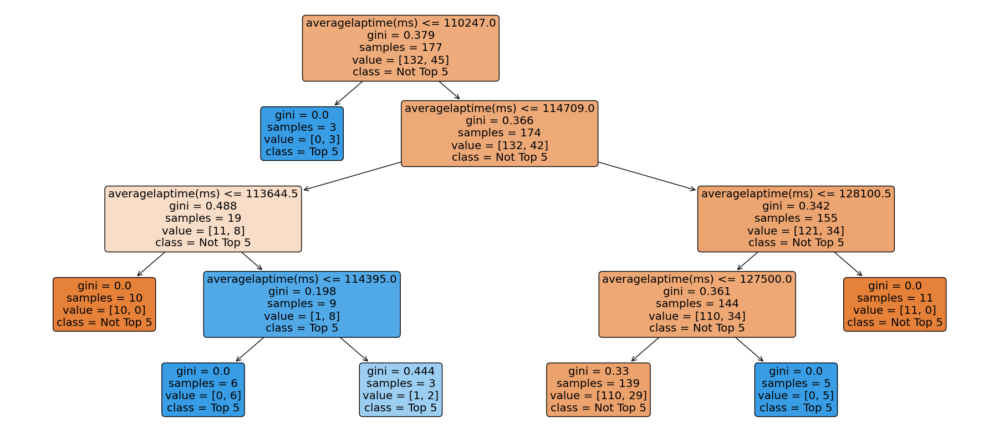

In [55]:
# classification tree for timedf vs position

classtreemodel(time_ml, pos_ml, 4, True, True, 0.25) # we define we want depth of 4, we want the class tree, we want the confusion matrix and we want a train:test ratio of 0.25

		 Train Dataset
Classification Accuracy		: 0.8700564971751412

		 Test Dataset
Classification Accuracy		: 0.7166666666666667

		 Train Dataset
True Positive Rate		: 0.5365853658536586

		 Test Dataset
True Positive Rate		: 0.21052631578947367

		 Train Dataset
True Negative Rate		: 0.9705882352941176

		 Test Dataset
True Negative Rate		: 0.9512195121951219

		 Train Dataset
False Positive Rate		: 0.029411764705882353

		 Test Dataset
False Positive Rate		: 0.04878048780487805

		 Train Dataset
False Negative Rate		: 0.4634146341463415

		 Test Dataset
False Negative Rate		: 0.7894736842105263



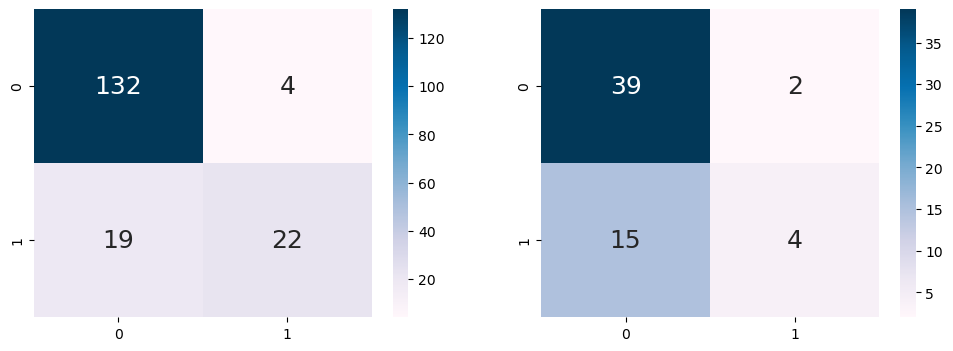

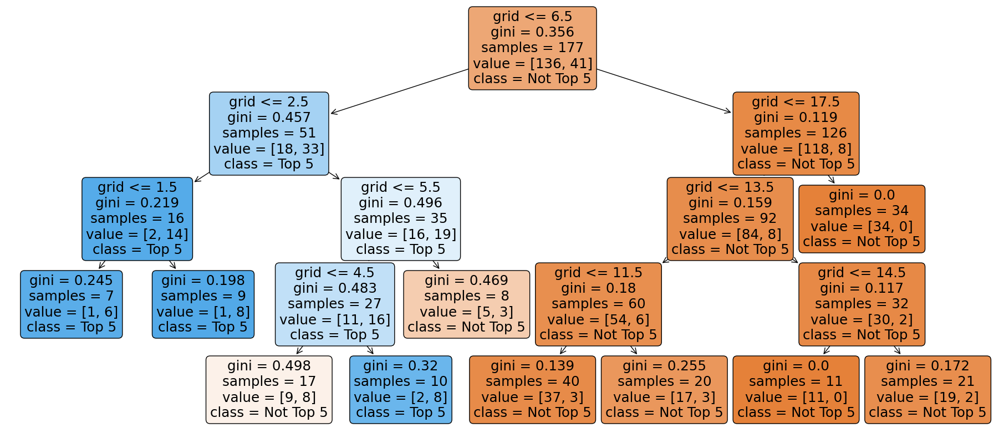

In [56]:
# classification tree for griddf vs position

classtreemodel(grid_ml, pos_ml, 4, True, True, 0.25) # we define we want depth of 4, we want the class tree, we want the confusion matrix and we want a train:test ratio of 0.25

<br><br><br>
<span style="font-family: Courier New; font-size: 25px; font-weight: bold;">  
Multi-Variate Classification Tree // Machine Learning
</span>
<br><br><br>

		 Train Dataset
Classification Accuracy		: 0.9209039548022598

		 Test Dataset
Classification Accuracy		: 0.95

		 Train Dataset
True Positive Rate		: 0.782608695652174

		 Test Dataset
True Positive Rate		: 0.9285714285714286

		 Train Dataset
True Negative Rate		: 0.9694656488549618

		 Test Dataset
True Negative Rate		: 0.9565217391304348

		 Train Dataset
False Positive Rate		: 0.030534351145038167

		 Test Dataset
False Positive Rate		: 0.043478260869565216

		 Train Dataset
False Negative Rate		: 0.21739130434782608

		 Test Dataset
False Negative Rate		: 0.07142857142857142



<Axes: >

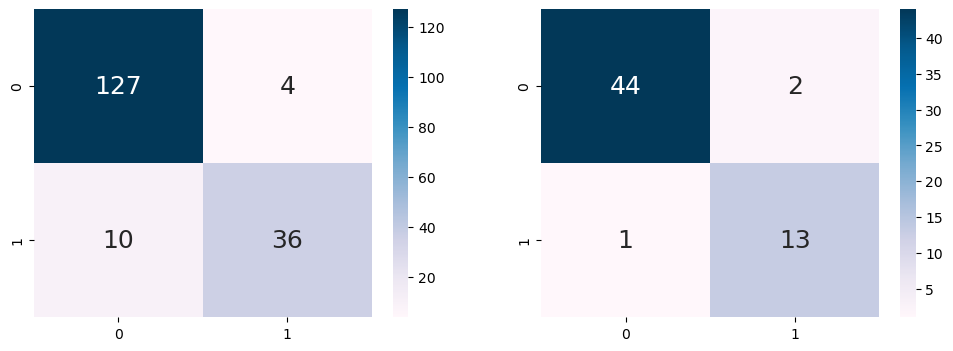

In [57]:
# Import essential models and functions from sklearn
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

# Extract Response and Predictors
predictors = ["averagepit(s)", "fastestlaptime(ms)", "averagelaptime(ms)", "grid"]

y = pd.DataFrame(mldf['position'])
X = pd.DataFrame(mldf[predictors]) 

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 5)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

tntrain, fptrain, fntrain, tptrain = confusion_matrix(y_train, y_train_pred).ravel()
tntest, fptest, fntest, tptest = confusion_matrix(y_test, y_test_pred).ravel()

print("\t\t Train Dataset")
print("Classification Accuracy\t\t:", dectree.score(X_train, y_train))
print()

print("\t\t Test Dataset")
print("Classification Accuracy\t\t:", dectree.score(X_test, y_test))
print()

print("\t\t Train Dataset")
print("True Positive Rate\t\t:", rate(tptrain, fntrain))
print()

print("\t\t Test Dataset")
print("True Positive Rate\t\t:", rate(tptest, fntest))
print()

print("\t\t Train Dataset")
print("True Negative Rate\t\t:", rate(tntrain, fptrain))
print()

print("\t\t Test Dataset")
print("True Negative Rate\t\t:", rate(tntest, fptest))
print()

print("\t\t Train Dataset")
print("False Positive Rate\t\t:", rate(fptrain, tntrain))
print()

print("\t\t Test Dataset")
print("False Positive Rate\t\t:", rate(fptest, tntest))
print()

print("\t\t Train Dataset")
print("False Negative Rate\t\t:", rate(fntrain, tptrain))
print()

print("\t\t Test Dataset")
print("False Negative Rate\t\t:", rate(fntest, tptest))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0], cmap="PuBu")
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1], cmap="PuBu")

# a tree can never tell you with certainty, it is always probabilistic at the leaf node.

[Text(0.4807692307692308, 0.9166666666666666, 'grid <= 7.5\ngini = 0.385\nsamples = 177\nvalue = [131, 46]\nclass = Not Top 5'),
 Text(0.28846153846153844, 0.75, 'averagepit(s) <= 30.859\ngini = 0.481\nsamples = 62\nvalue = [25, 37]\nclass = Top 5'),
 Text(0.19230769230769232, 0.5833333333333334, 'fastestlaptime(ms) <= 113657.0\ngini = 0.452\nsamples = 55\nvalue = [19, 36]\nclass = Top 5'),
 Text(0.15384615384615385, 0.4166666666666667, 'grid <= 3.5\ngini = 0.426\nsamples = 52\nvalue = [16, 36]\nclass = Top 5'),
 Text(0.07692307692307693, 0.25, 'averagepit(s) <= 22.376\ngini = 0.105\nsamples = 18\nvalue = [1, 17]\nclass = Top 5'),
 Text(0.038461538461538464, 0.08333333333333333, 'gini = 0.5\nsamples = 2\nvalue = [1, 1]\nclass = Not Top 5'),
 Text(0.11538461538461539, 0.08333333333333333, 'gini = 0.0\nsamples = 16\nvalue = [0, 16]\nclass = Top 5'),
 Text(0.23076923076923078, 0.25, 'averagelaptime(ms) <= 117503.0\ngini = 0.493\nsamples = 34\nvalue = [15, 19]\nclass = Top 5'),
 Text(0.192

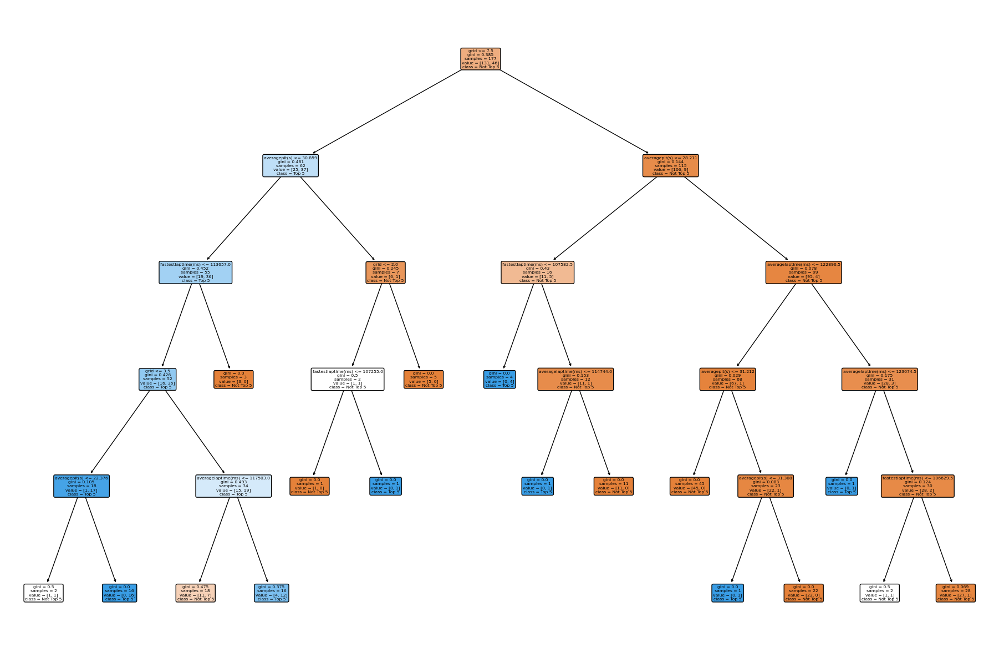

In [58]:
# plot the trained decision tree

from sklearn.tree import plot_tree

f = plt.figure(figsize=(23,15))
plot_tree(dectree, filled=True, rounded=True, 
          feature_names=X_train.columns.tolist(), 
          class_names=["Not Top 5", "Top 5"])

<br><br><br>
<span style="font-family: Courier New; font-size: 18px; font-weight: bold;">  
Prediction using Multi-Variate Class Tree // Machine Learning
</span>
<br><br><br>

In [59]:
# extract rows for prediction of results

merge_df3 = merge_df3[merge_df3['averagepit(s)'].notna()]
merge_df3.loc[merge_df3['position'] == -1, 'position'] = 0 # set DNF to -1
mergedf_pred = merge_df3[merge_df3["driverId"].isin(["VER"])]

In [60]:
# extract predictors for prediction
X_pred = pd.DataFrame(mergedf_pred[predictors])

# predict response corresponding to predictors
y_pred = dectree.predict(X_pred)
y_pred # print the predictions of legendary.

array([0, 0, 0, 0, 0, 1, 0, 0])

In [61]:
# summarize the actuals and predictions
y_pred = pd.DataFrame(y_pred, columns = ["PredPosition"], index = mergedf_pred.index)
mergedf_acc = pd.concat([mergedf_pred[["driverId", "raceId", "position"]], y_pred], axis = 1)

mergedf_acc # print the comparison of their actual status vs the predicted.

,driverId,raceId,position,PredPosition
82,VER,2012,0,0
88,VER,2013,0,0
119,VER,2014,0,0
133,VER,2015,0,0
152,VER,2016,0,0
193,VER,2018,1,1
214,VER,2019,1,0
229,VER,2022,0,0


<br><br><br>
<span style="font-family: Courier New; font-size: 25px; font-weight: bold;">  
Random Forest Classification // Machine Learning
</span>
<br><br><br>

In [62]:
# Import essential models and functions from sklearn
from sklearn.model_selection import train_test_split

# Extract Response and Predictors
y = pd.DataFrame(mldf['position'])
X = pd.DataFrame(mldf.drop('position', axis = 1))

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Import RandomForestClassifier model from Scikit-Learn
from sklearn.ensemble import RandomForestClassifier

# Create the Random Forest object
rforest = RandomForestClassifier(n_estimators = 100, max_depth = 4)     

# Fit Random Forest on Train Data
rforest.fit(X_train, y_train.position.ravel())

RandomForestClassifier(max_depth=4)

		 Train Dataset
Classification Accuracy		: 0.9717514124293786

		 Test Dataset
Classification Accuracy		: 0.85

		 Train Dataset
True Positive Rate		: 0.9285714285714286

		 Test Dataset
True Positive Rate		: 0.6666666666666666

		 Train Dataset
True Negative Rate		: 0.9851851851851852

		 Test Dataset
True Negative Rate		: 0.9285714285714286

		 Train Dataset
False Positive Rate		: 0.014814814814814815

		 Test Dataset
False Positive Rate		: 0.07142857142857142

		 Train Dataset
False Negative Rate		: 0.07142857142857142

		 Test Dataset
False Negative Rate		: 0.3333333333333333



<Axes: >

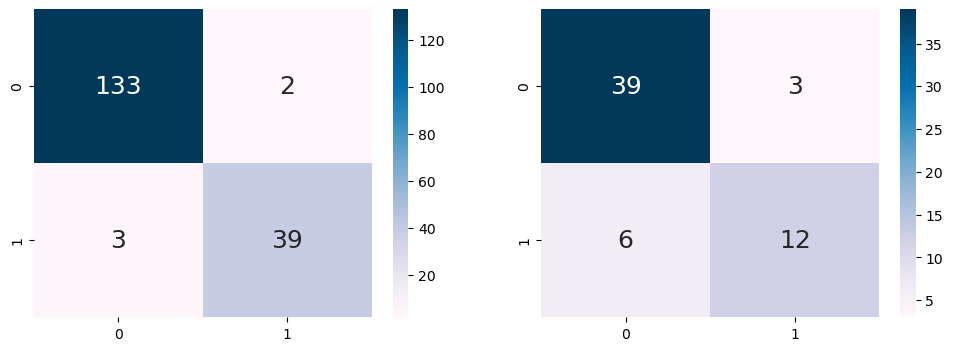

In [63]:
# Import confusion_matrix from Scikit-Learn
from sklearn.metrics import confusion_matrix

# Predict the Response corresponding to Predictors
y_train_pred = rforest.predict(X_train)

# Predict the Response corresponding to Predictors
y_test_pred = rforest.predict(X_test)

tntrain, fptrain, fntrain, tptrain = confusion_matrix(y_train, y_train_pred).ravel()
tntest, fptest, fntest, tptest = confusion_matrix(y_test, y_test_pred).ravel()

print("\t\t Train Dataset")
print("Classification Accuracy\t\t:", rforest.score(X_train, y_train))
print()

print("\t\t Test Dataset")
print("Classification Accuracy\t\t:", rforest.score(X_test, y_test))
print()

print("\t\t Train Dataset")
print("True Positive Rate\t\t:", rate(tptrain, fntrain))
print()

print("\t\t Test Dataset")
print("True Positive Rate\t\t:", rate(tptest, fntest))
print()

print("\t\t Train Dataset")
print("True Negative Rate\t\t:", rate(tntrain, fptrain))
print()

print("\t\t Test Dataset")
print("True Negative Rate\t\t:", rate(tntest, fptest))
print()

print("\t\t Train Dataset")
print("False Positive Rate\t\t:", rate(fptrain, tntrain))
print()

print("\t\t Test Dataset")
print("False Positive Rate\t\t:", rate(fptest, tntest))
print()

print("\t\t Train Dataset")
print("False Negative Rate\t\t:", rate(fntrain, tptrain))
print()

print("\t\t Test Dataset")
print("False Negative Rate\t\t:", rate(fntest, tptest))
print()

f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0], cmap="PuBu")
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1], cmap="PuBu")

<br><br><br>
<span style="font-family: Courier New; font-size: 18px; font-weight: bold;">  
Random Forest with GridSearchCV// Machine Learning
</span>
<br><br><br>

In [64]:
# Optimising parameters using GridSearchCV

from sklearn.ensemble import RandomForestClassifier

X_train, X_test, y_train, y_test = train_test_split(mldf_up_pred, mldf_up_res, test_size=0.25, random_state=42)

RF_model = RandomForestClassifier()

search_space3 = {
    'n_estimators' : [100,500,1000,1500],
    'max_depth' : [4,5,6],
    'max_samples' : [0.25,0.5,0.75,1.0],
    'max_features' : ['sqrt', 'log2', 0.2, 0.4, 0.6, 0.8, 1.0]
}

In [65]:
GS3 = GridSearchCV(estimator = RF_model,
                  param_grid = search_space3,
                  cv = 4,
                  scoring = ['f1', 'accuracy', 'precision'],
                  refit = 'f1',
                  verbose = 4,
                  n_jobs = -1)

In [66]:
GS3.fit(X_train, y_train)

Fitting 4 folds for each of 336 candidates, totalling 1344 fits
[CV 2/4] END C=29.763514416313132, max_iter=100, penalty=l1, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 3/4] END C=29.763514416313132, max_iter=100, penalty=l1, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 4/4] END C=29.763514416313132, max_iter=100, penalty=l1, solver=newton-cg; accuracy: (test=nan) f1: (test=nan) precision: (test=nan) total time=   0.0s
[CV 1/4] END C=29.763514416313132, max_iter=100, penalty=l1, solver=liblinear; accuracy: (test=0.836) f1: (test=0.849) precision: (test=0.775) total time=   0.0s
[CV 2/4] END C=29.763514416313132, max_iter=100, penalty=l1, solver=liblinear; accuracy: (test=0.803) f1: (test=0.812) precision: (test=0.778) total time=   0.0s
[CV 3/4] END C=29.763514416313132, max_iter=100, penalty=l1, solver=liblinear; accuracy: (test=0.909) f1: (test=0.912) precision: (test=0.886) t

GridSearchCV(cv=4, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [4, 5, 6],
                         'max_features': ['sqrt', 'log2', 0.2, 0.4, 0.6, 0.8,
                                          1.0],
                         'max_samples': [0.25, 0.5, 0.75, 1.0],
                         'n_estimators': [100, 500, 1000, 1500]},
             refit='f1', scoring=['f1', 'accuracy', 'precision'], verbose=4)

In [67]:
print(GS3.best_estimator_)

RandomForestClassifier(max_depth=6, max_samples=1.0, n_estimators=500)


In [68]:
print(GS3.best_score_)

0.9231876105115542


In [71]:
# Using Optimised parameters
from sklearn.model_selection import train_test_split

# Extract Response and Predictors
y = pd.DataFrame(mldf_up_res)
X = pd.DataFrame(mldf_up_pred)

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 42)

# Import RandomForestClassifier model from Scikit-Learn
from sklearn.ensemble import RandomForestClassifier

# Create the Random Forest object
rforest = RandomForestClassifier(max_depth=6, max_samples=1.0, n_estimators=500)

# Fit Random Forest on Train Data
rforest.fit(X_train, y_train.position.ravel())

RandomForestClassifier(max_depth=6, max_samples=1.0, n_estimators=500)

		 Train Dataset
Classification Accuracy		: 0.9735849056603774

		 Test Dataset
Classification Accuracy		: 0.9213483146067416

		 Train Dataset
True Positive Rate		: 1.0

		 Test Dataset
True Positive Rate		: 0.9565217391304348

		 Train Dataset
True Negative Rate		: 0.9477611940298507

		 Test Dataset
True Negative Rate		: 0.8837209302325582

		 Train Dataset
False Positive Rate		: 0.05223880597014925

		 Test Dataset
False Positive Rate		: 0.11627906976744186

		 Train Dataset
False Negative Rate		: 0.0

		 Test Dataset
False Negative Rate		: 0.043478260869565216



<Axes: >

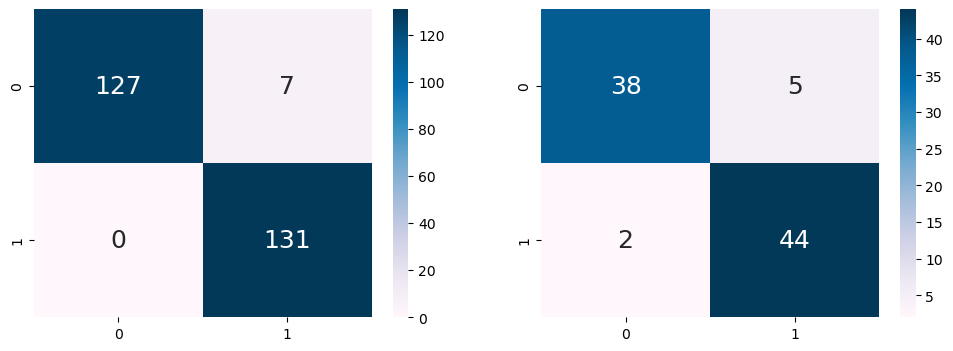

In [72]:
# Import confusion_matrix from Scikit-Learn
from sklearn.metrics import confusion_matrix

# Predict the Response corresponding to Predictors
y_train_pred = rforest.predict(X_train)

# Predict the Response corresponding to Predictors
y_test_pred = rforest.predict(X_test)

tntrain, fptrain, fntrain, tptrain = confusion_matrix(y_train, y_train_pred).ravel()
tntest, fptest, fntest, tptest = confusion_matrix(y_test, y_test_pred).ravel()

print("\t\t Train Dataset")
print("Classification Accuracy\t\t:", rforest.score(X_train, y_train))
print()

print("\t\t Test Dataset")
print("Classification Accuracy\t\t:", rforest.score(X_test, y_test))
print()

print("\t\t Train Dataset")
print("True Positive Rate\t\t:", rate(tptrain, fntrain))
print()

print("\t\t Test Dataset")
print("True Positive Rate\t\t:", rate(tptest, fntest))
print()

print("\t\t Train Dataset")
print("True Negative Rate\t\t:", rate(tntrain, fptrain))
print()

print("\t\t Test Dataset")
print("True Negative Rate\t\t:", rate(tntest, fptest))
print()

print("\t\t Train Dataset")
print("False Positive Rate\t\t:", rate(fptrain, tntrain))
print()

print("\t\t Test Dataset")

print("False Positive Rate\t\t:", rate(fptest, tntest))
print()

print("\t\t Train Dataset")
print("False Negative Rate\t\t:", rate(fntrain, tptrain))
print()

print("\t\t Test Dataset")
print("False Negative Rate\t\t:", rate(fntest, tptest))
print()

f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0], cmap="PuBu")
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1], cmap="PuBu")